In [1]:
%load_ext autoreload
%autoreload 2
import tensorflow as tf
from tensorflow.python.ops import array_ops
import numpy as np
import matplotlib.pyplot as plt
import processes
from processes import orstein_uhlenbeck as ou
import utils
from utils import kalman
import buildingblocks
from buildingblocks import stupidcell

/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: compiletime version 3.6 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.5
  return f(*args, **kwds)
/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


## Network

In [2]:
def build_optimizer(loss, learning_rate, grad_clip):
    ''' Build optmizer for training, using gradient clipping.
    
        Arguments:
        loss: Network loss
        learning_rate: Learning rate for optimizer
    
    '''
    
    # Optimizer for training, using gradient clipping to control exploding gradients
    tvars = tf.trainable_variables()
    grads, _ = tf.clip_by_global_norm(tf.gradients(loss, tvars), grad_clip)
    train_op = tf.train.AdamOptimizer(learning_rate)
    optimizer = train_op.apply_gradients(zip(grads, tvars))
    
    return optimizer

In [3]:

graph=tf.Graph()


In [4]:
logs_dir = './graphs/'
batch_size=128
num_steps=1095
lstm_layers= 1
lstm_size= 10
inputs_dim= 1
alpha = 0.1

In [5]:
with graph.as_default():
    inputs_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='inputs')
    targets_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='targets')
    learning_rate= tf.placeholder( tf.float32 , name='lr')
    grad_clip= tf.placeholder( tf.float32 , name='clip')

In [6]:

with graph.as_default():
    cell = stupidcell.StupidRNNCell(1,activation= None)
    
    '''
    stupidlstm = stupidcell.StupidLSTMCell(lstm_size)
    lstm = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm= tf.contrib.rnn.MultiRNNCell([lstm,stupidlstm])
    '''
    lstm1 = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm2 = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm= tf.contrib.rnn.MultiRNNCell([lstm1,lstm2])
    W = tf.Variable(tf.random_normal([lstm_size, lstm_size]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ lstm_size]), dtype=tf.float32)
    def residual_wrapper( i,o):
        out = tf.matmul( o, W)+b
        out = tf.sigmoid( out)
        return array_ops.concat([i,out],1)
    lstm = tf.contrib.rnn.ResidualWrapper( lstm, (lambda i, o: array_ops.concat([i,o],1)) )
    
    rnn_cell = tf.contrib.rnn.MultiRNNCell([lstm,cell])
# 'outputs' is a tensor of shape [batch_size, max_time, cell_state_size]

# defining initial state
    initial_state = rnn_cell.zero_state(batch_size, dtype=tf.float32)

# 'state' is a tensor of shape [batch_size, cell_state_size]
    outputs, state = tf.nn.dynamic_rnn(rnn_cell, inputs_,
                                   initial_state=initial_state,
                                   dtype=tf.float32)
    '''
    W = tf.Variable(tf.random_normal([lstm_size, inputs_dim]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ inputs_dim]), dtype=tf.float32) # biases
    shape = outputs.shape
    
    outputs = tf.matmul( tf.reshape( outputs, [-1, lstm_size]), W ) + b
    outputs = tf.reshape( outputs, (shape[0],shape[1],b.shape[0]))
    '''


(128, 2)


In [7]:
with graph.as_default():
    square=  tf.reduce_mean( tf.square( outputs - targets_),axis=0 )
    shape = square.shape
    square = tf.reshape(square, [shape[0],])
    def power(x):
        alpha =0.96
        return (1-alpha)*tf.pow(alpha,x)
    weights = tf.map_fn(  power, tf.range( start= shape[0]-1, delta=-1., limit= -0.5  ) )
    cost = tf.losses.compute_weighted_loss( square, weights )
    optimizer= build_optimizer(cost, learning_rate, grad_clip)
    

## Batch

In [8]:


def batch_1( batch_size, num_steps, noise, dictionary,):
    while True:
        invariant_std = 0.3 +0.6*np.random.rand()
        rand = np.random.rand()
        lbd = 10**( (np.random.randint(3) -1 ) ) 
        sigma = invariant_std*np.sqrt(2*lbd)
        dictionary['sigma'] = sigma
        dictionary['lbd'] = lbd

        batch = np.random.randn( batch_size,num_steps+1,1)*noise
        trend =np.reshape( ou.process(**dictionary)[: num_steps+1] , [-1,1] )
        for i in range(batch_size):
            batch[i,:,:]=batch[i,:,:]+trend[:,:]
        
        yield (batch[:,:-1,:] , batch[:,1:,:],trend, dictionary )

    

In [9]:
invariant_std = 0.2
lbd = 1.
sigma = invariant_std*np.sqrt(2*lbd)
start= 365
dictionary = {'deltaT': 1./365,
              'T':3}
noise= 0.1/np.sqrt( dictionary['deltaT'])
generator1 = batch_1( batch_size , num_steps,noise ,dictionary)

In [10]:
generator= generator1

## Training

## Batch 1

-3.646546243550257


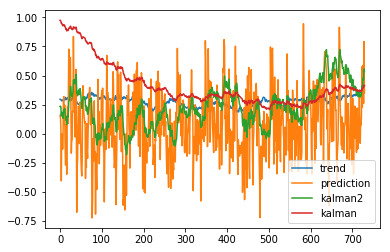

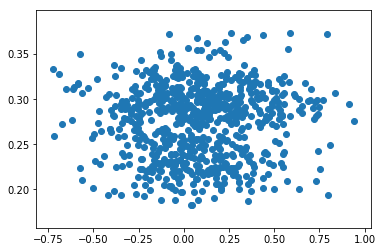

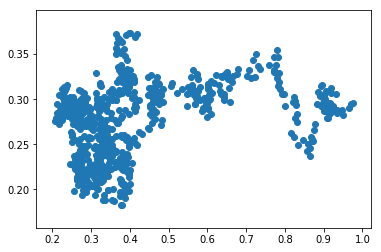

-3.6466956845019025


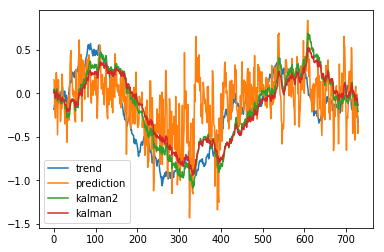

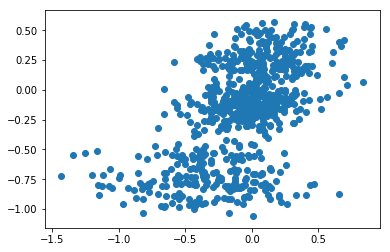

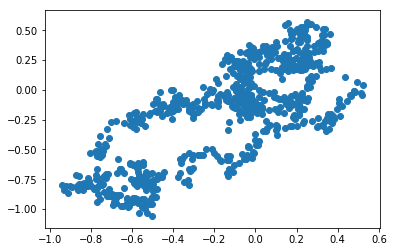

-3.646561119332911


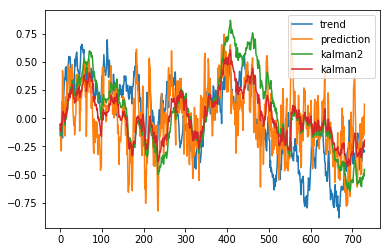

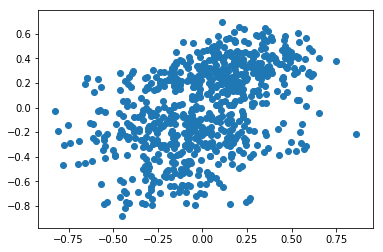

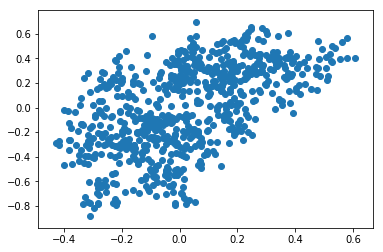

-3.6463491391390574


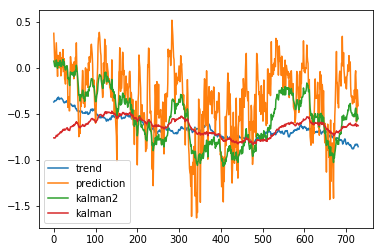

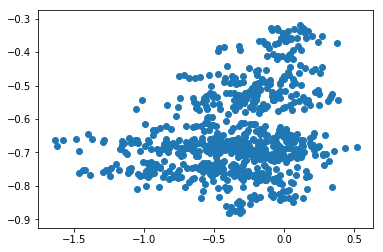

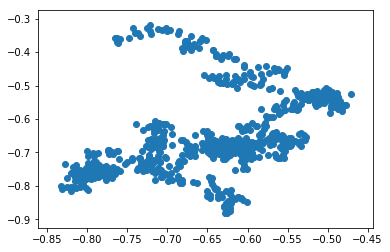

-3.6464899211190653


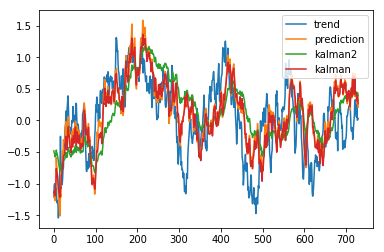

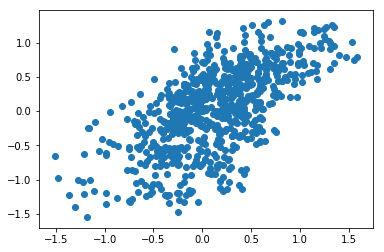

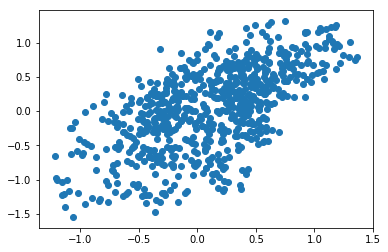

-3.6465648287907255


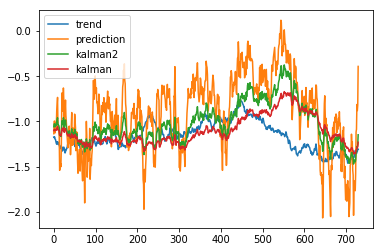

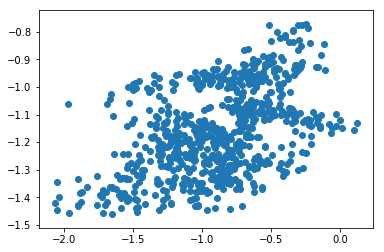

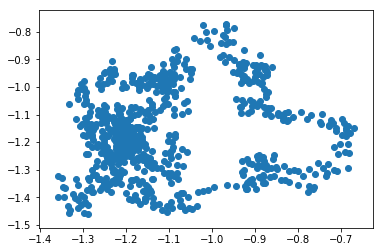

-3.6465799325145793


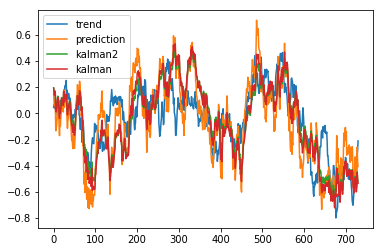

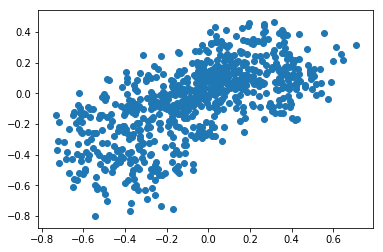

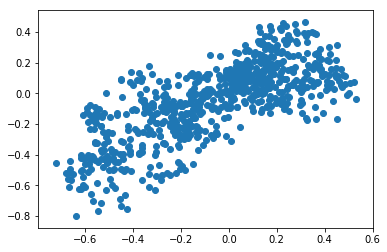

-3.6465971969068063


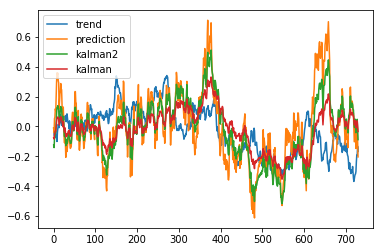

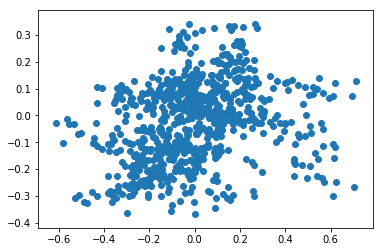

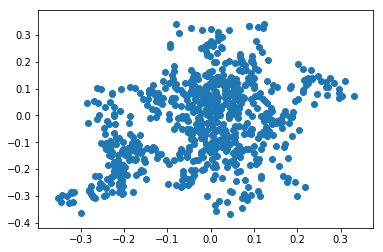

-3.646569425566123


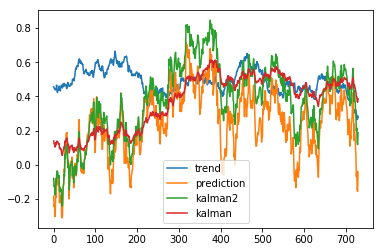

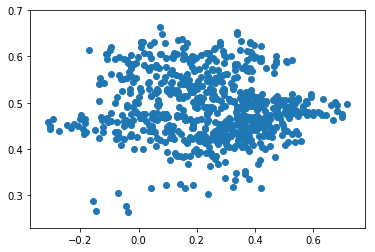

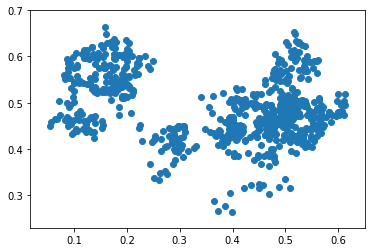

-3.6467254756484193


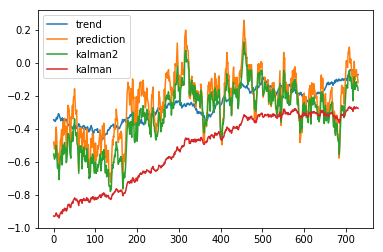

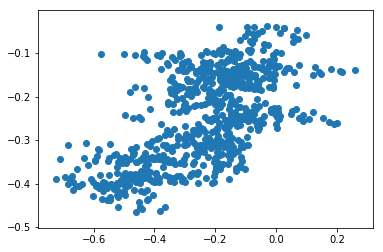

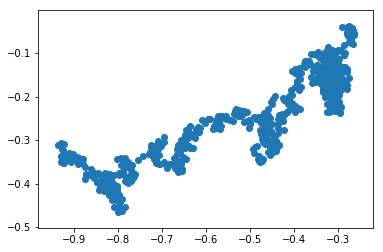

-3.646559169609101


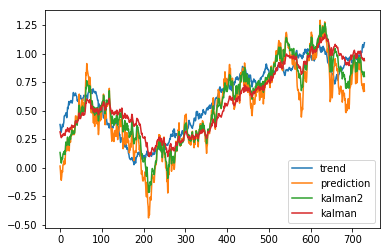

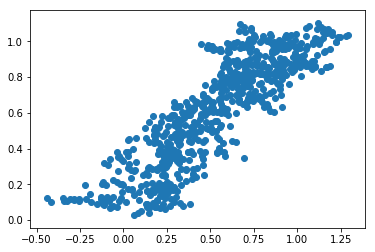

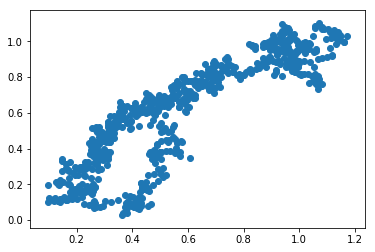

-3.6467678068205727


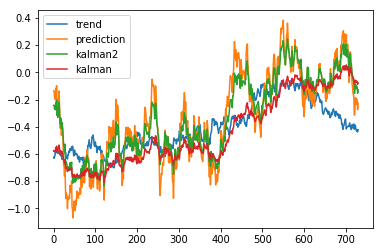

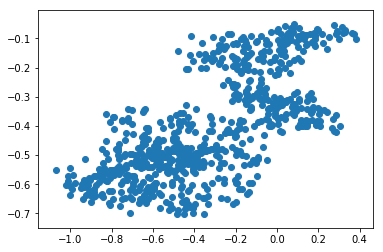

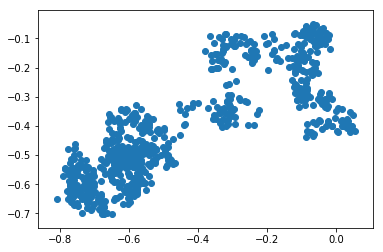

-3.6465365568641586


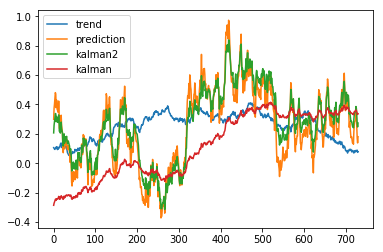

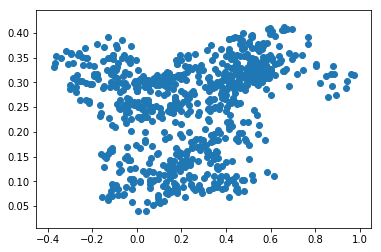

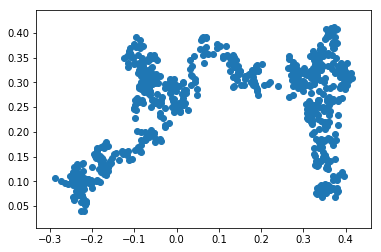

-3.646612138114871


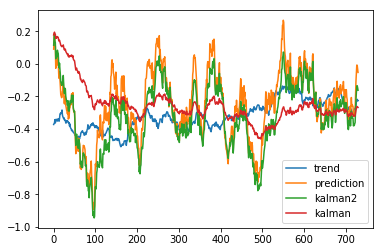

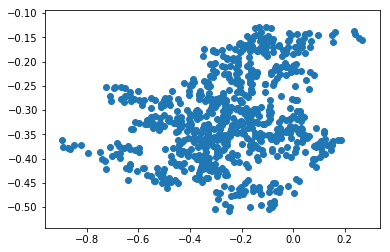

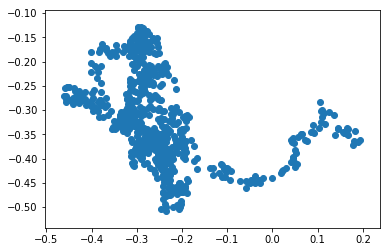

-3.6466035671532167


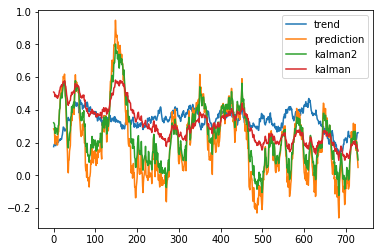

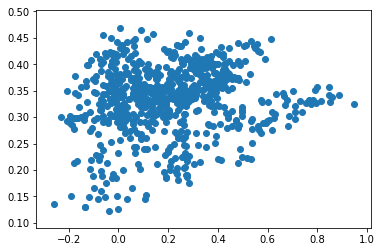

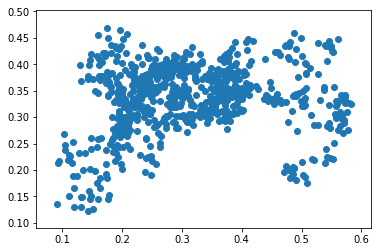

-3.6466822606511426


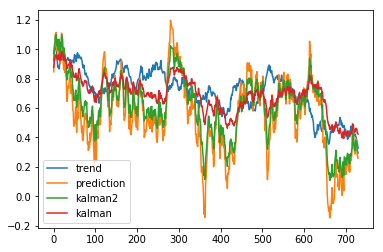

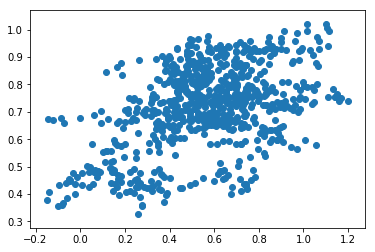

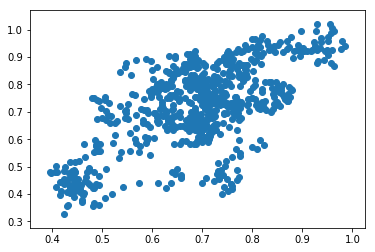

-3.646558749349789


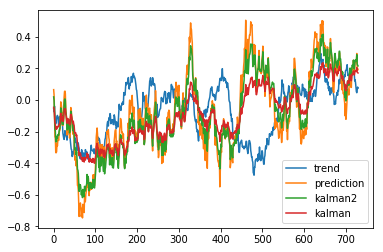

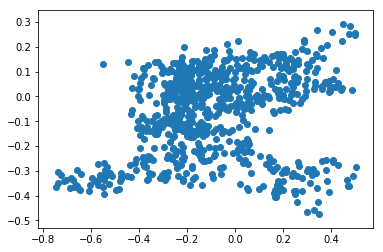

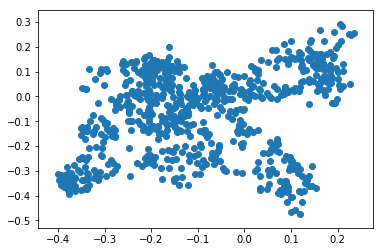

-3.64669348425232


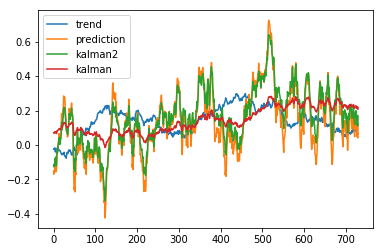

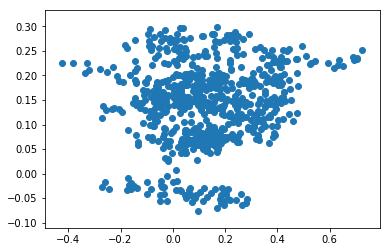

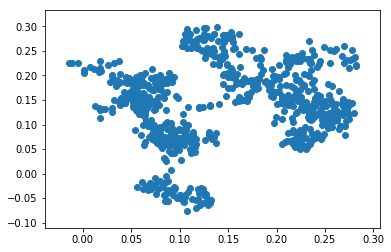

-3.646240456355737


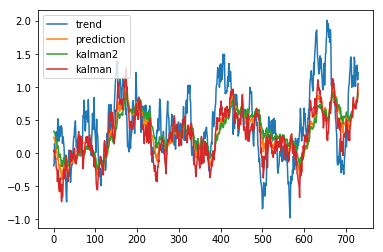

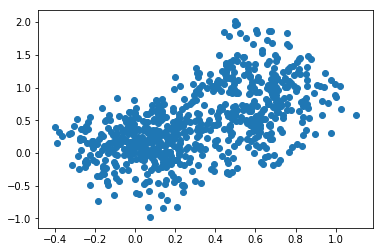

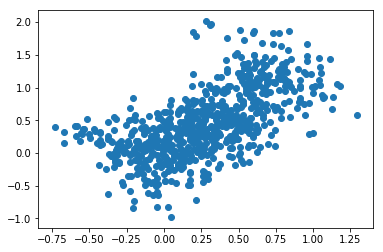

-3.6466394796501858


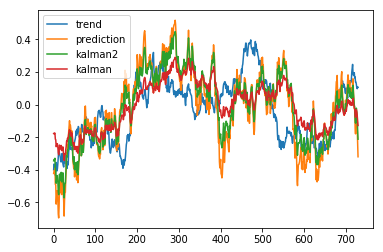

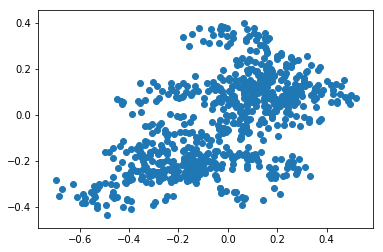

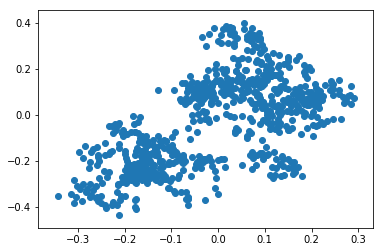

-3.6464895935263497


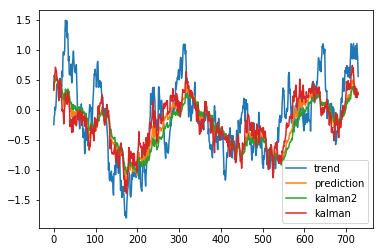

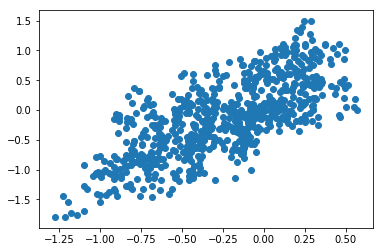

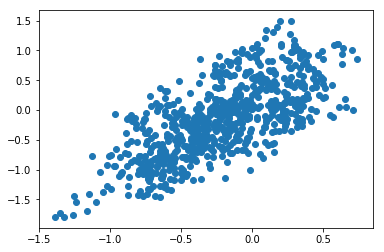

-3.6465997866820556


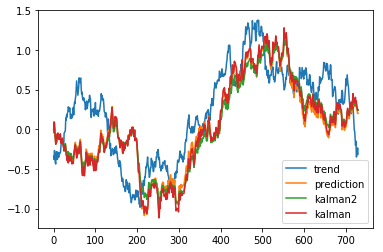

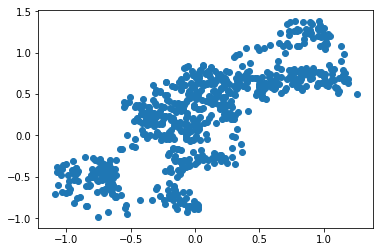

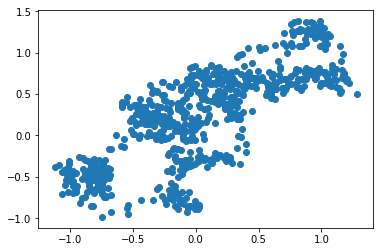

-3.6465695254504693


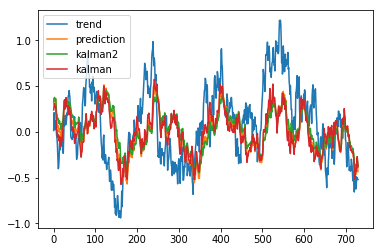

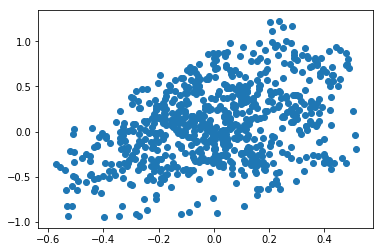

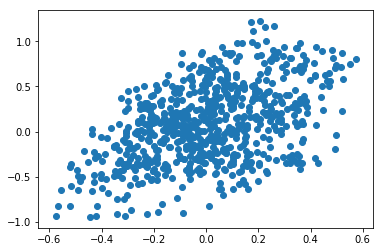

-3.646426985599102


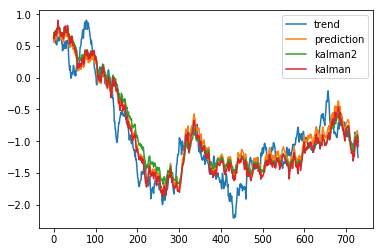

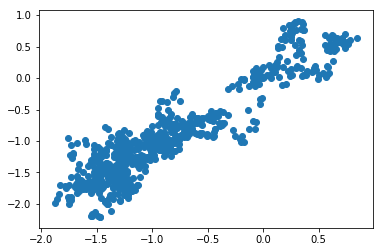

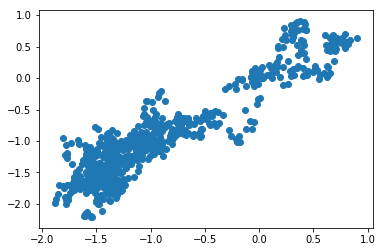

-3.6463218302000326


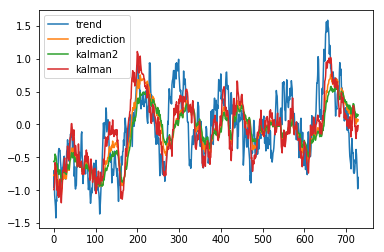

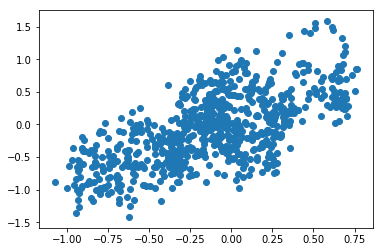

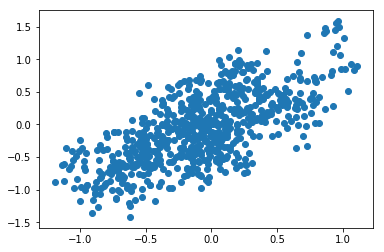

-3.6466743683908147


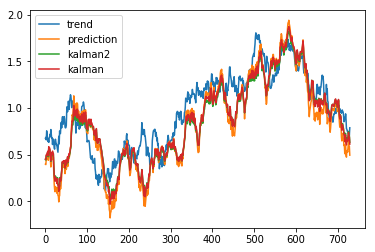

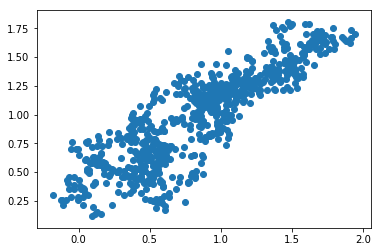

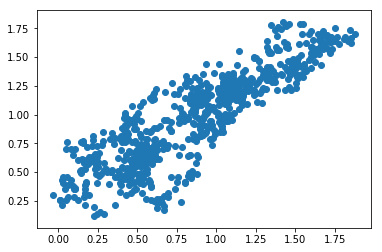

-3.646624207356946


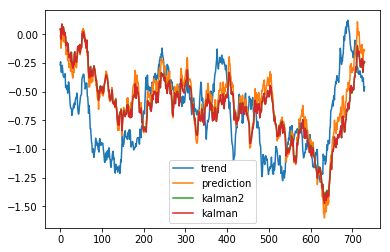

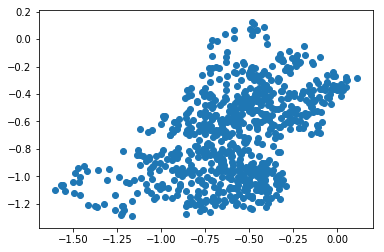

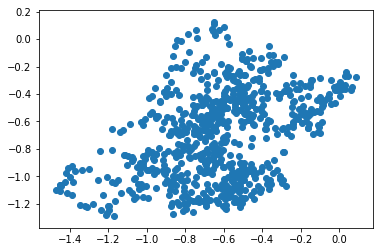

-3.6466202597133828


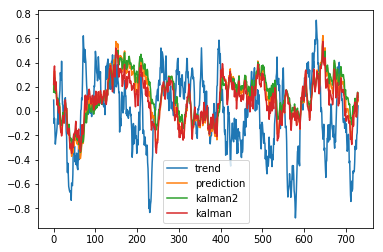

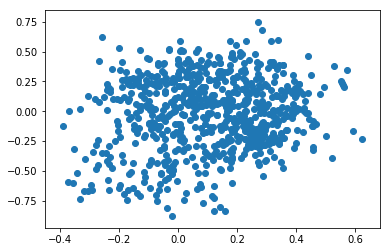

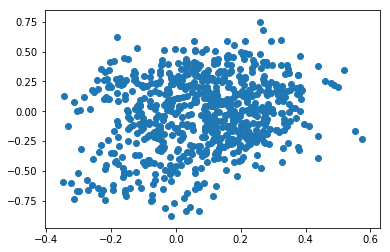

-3.6465792710427207


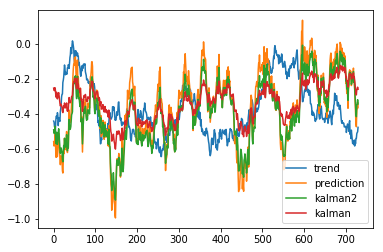

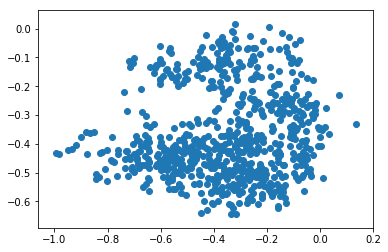

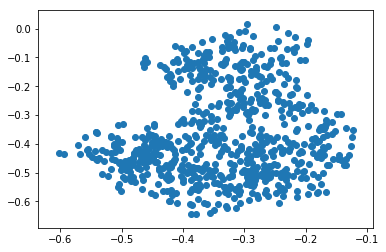

-3.6465297558810574


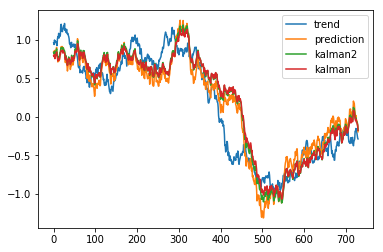

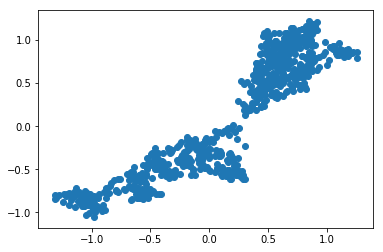

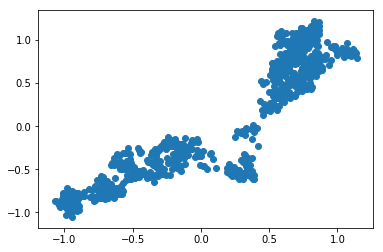

-3.646703047771008


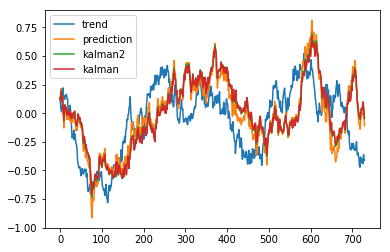

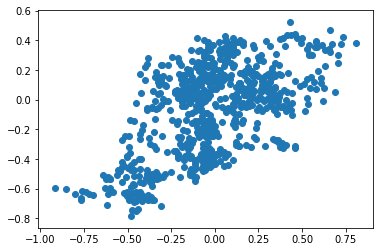

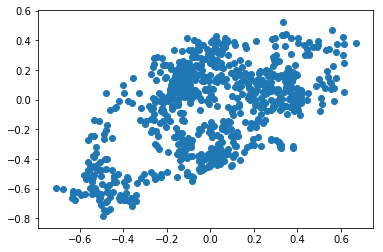

-3.646551043353976


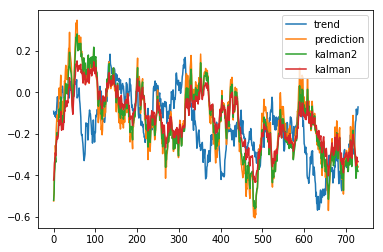

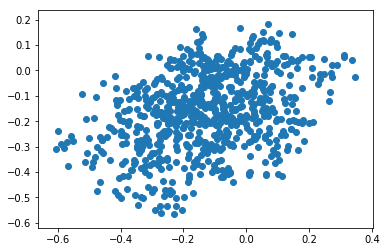

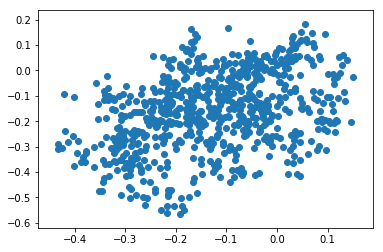

-3.646627819258721


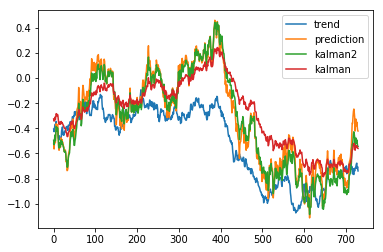

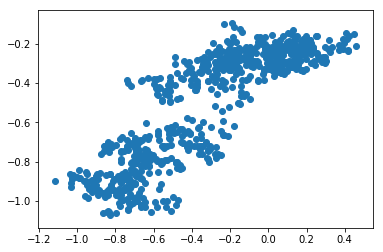

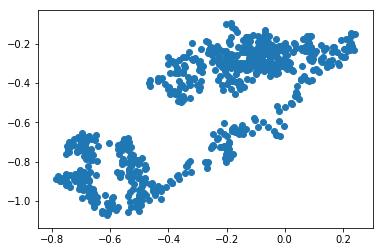

-3.646363046113403


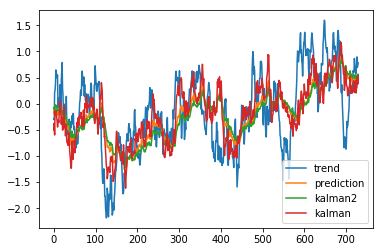

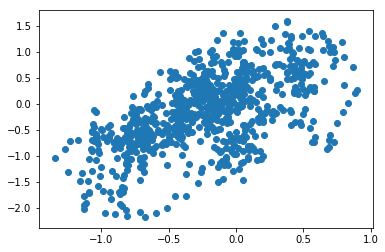

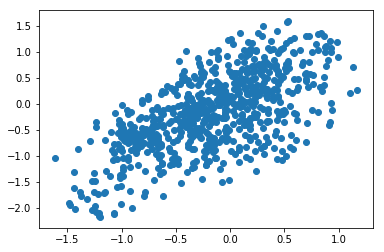

-3.646381632750855


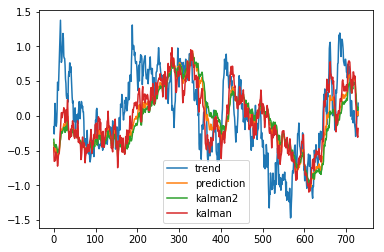

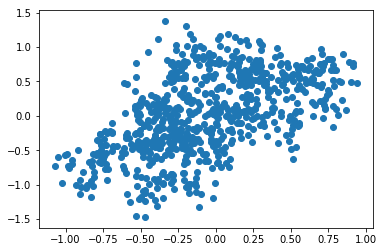

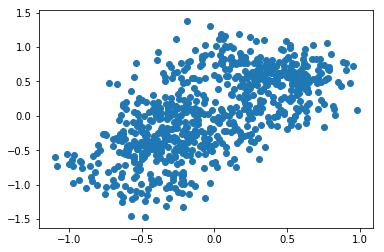

-3.6465180414728833


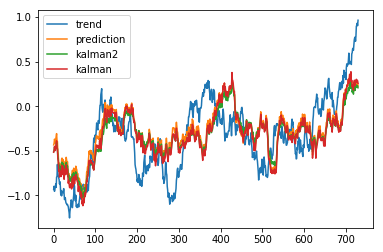

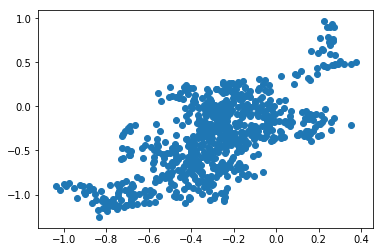

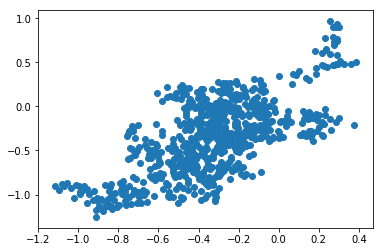

-3.6465489495079977


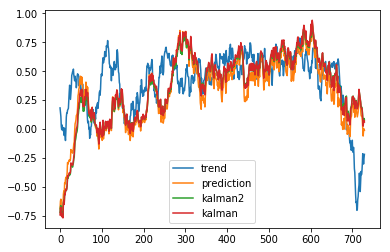

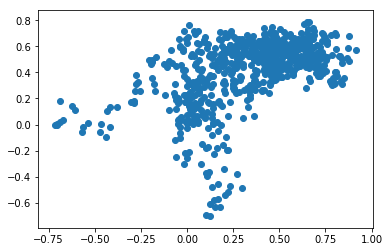

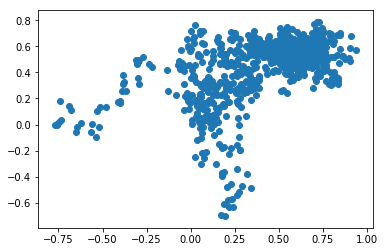

-3.6467287397012127


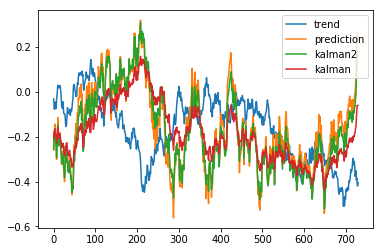

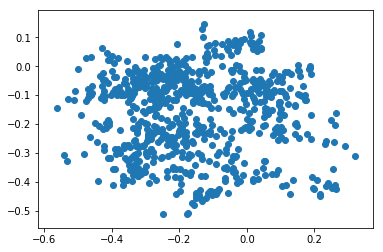

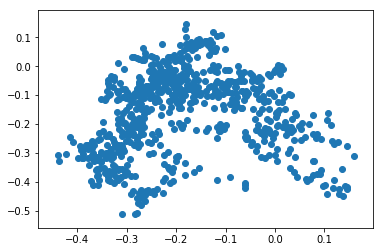

-3.646573194395752


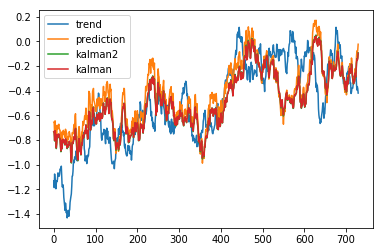

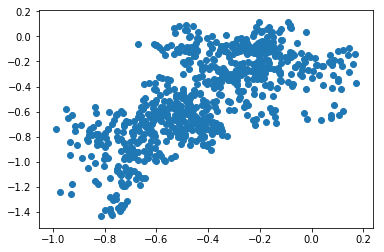

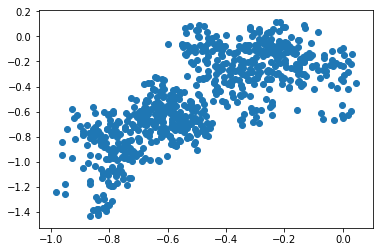

-3.646574593940751


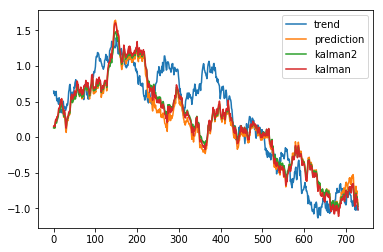

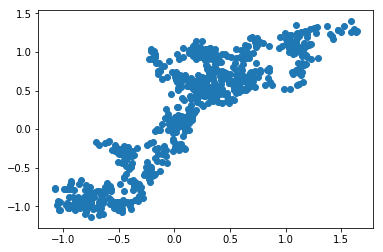

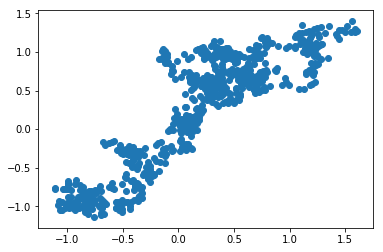

-3.6465634166728718


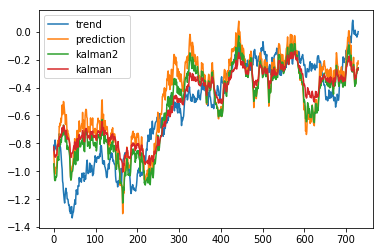

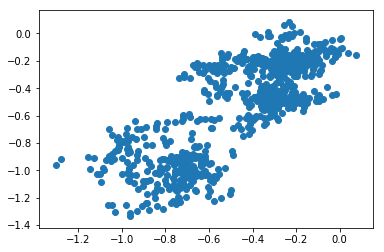

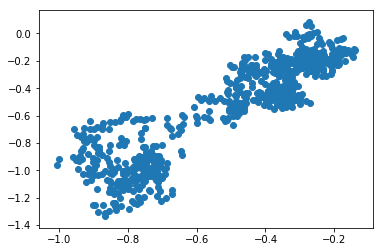

-3.646629978064449


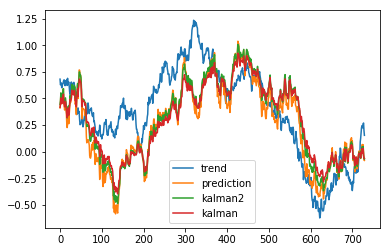

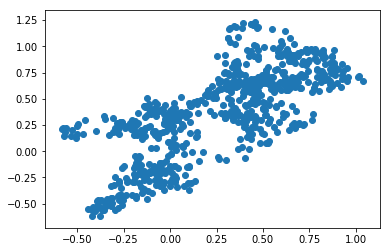

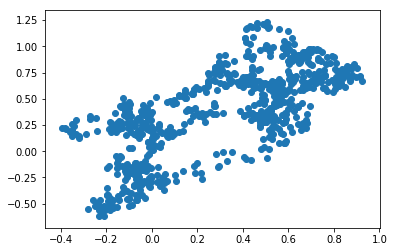

-3.646541935950519


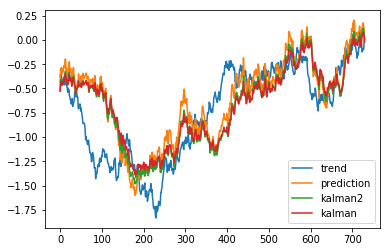

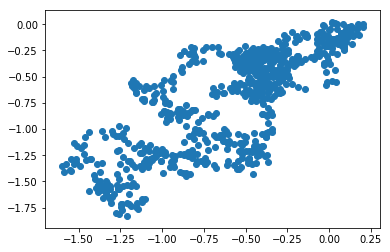

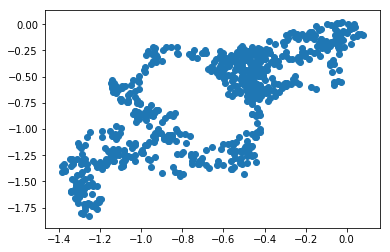

-3.646661605546252


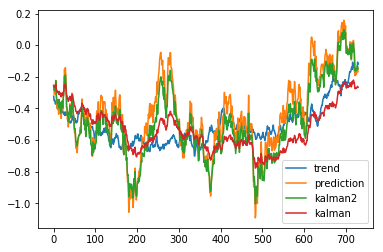

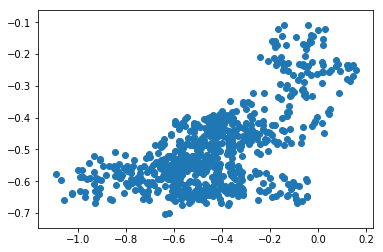

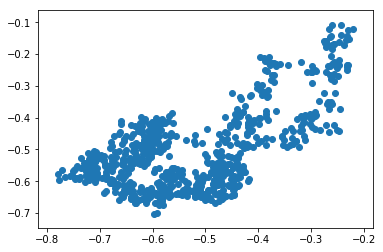

-3.6464960641227675


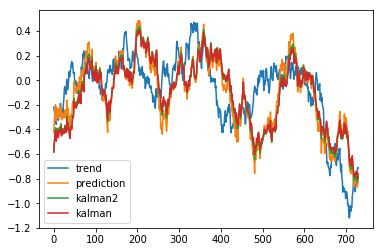

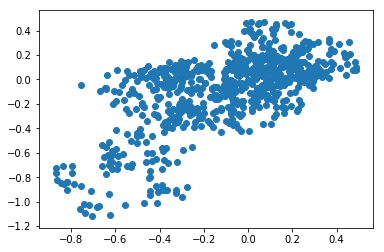

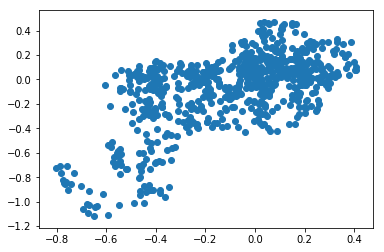

-3.646457517379896


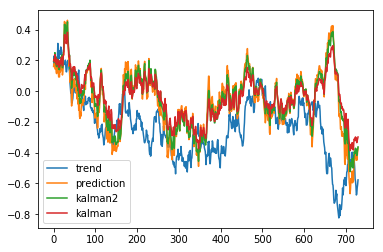

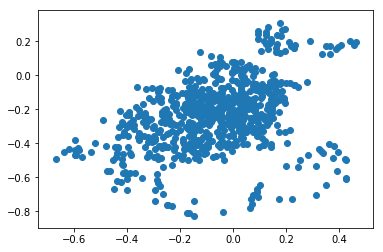

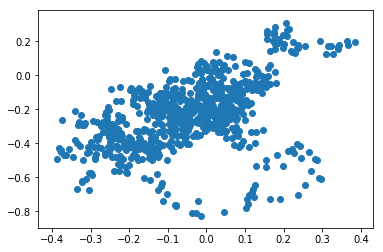

-3.6466428172774625


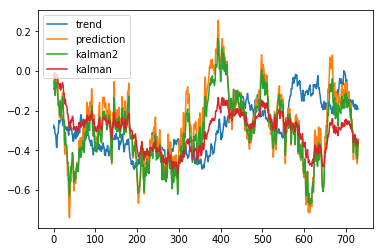

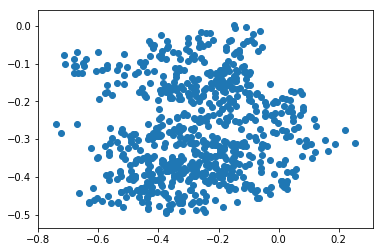

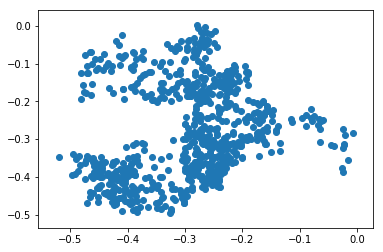

-3.6465890648309154


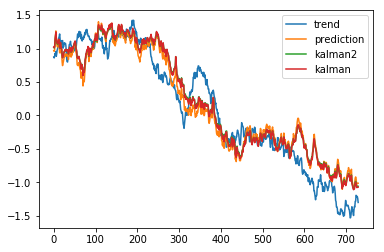

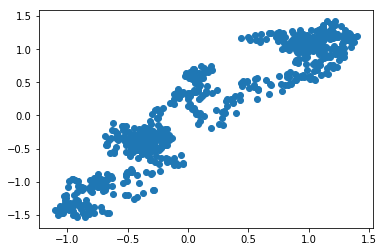

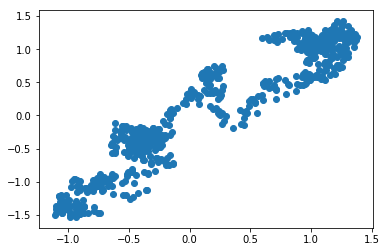

-3.646588959125803


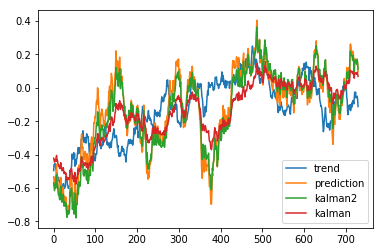

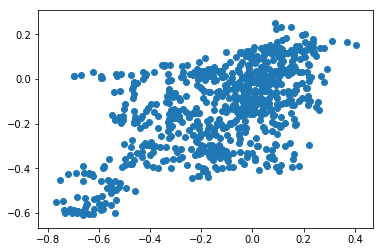

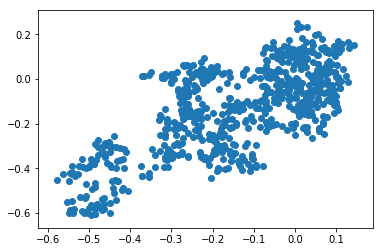

-3.6465802100487066


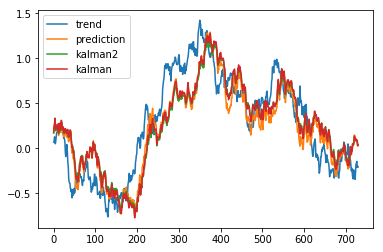

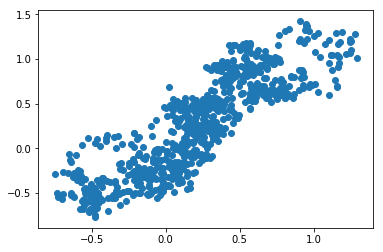

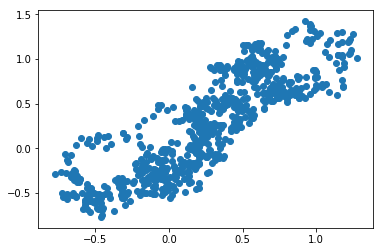

-3.6465935868676764


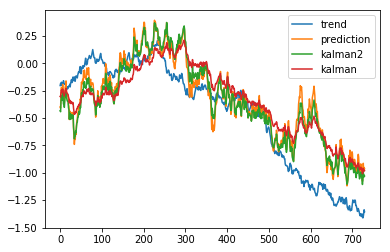

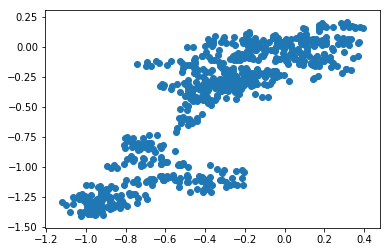

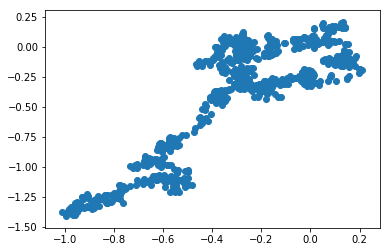

-3.6466956852003944


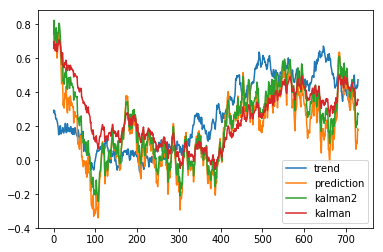

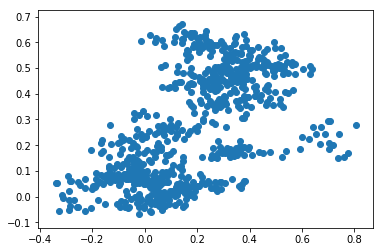

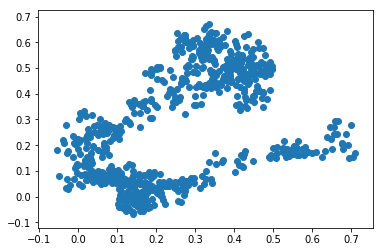

-3.646522056171672


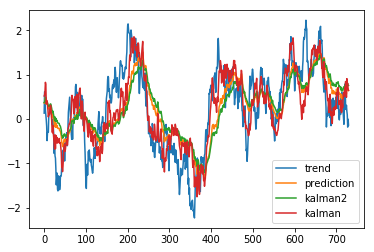

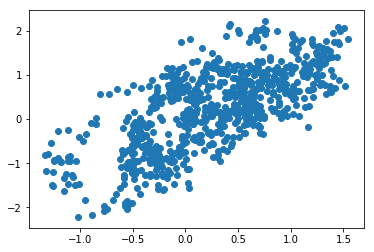

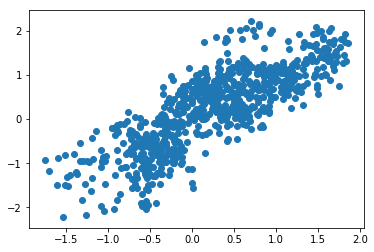

-3.6463569566607488


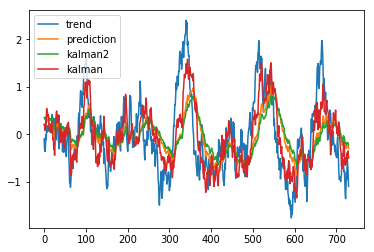

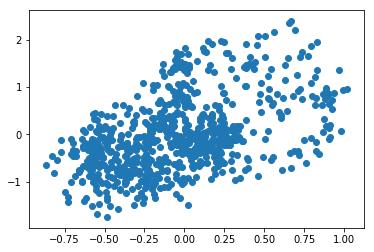

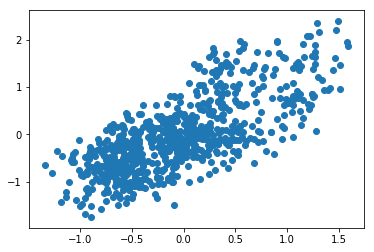

-3.6466211263090385


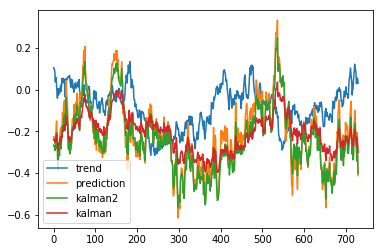

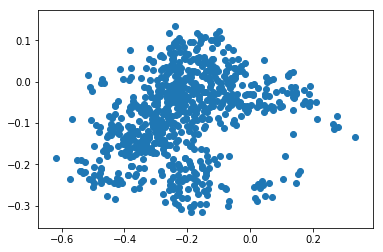

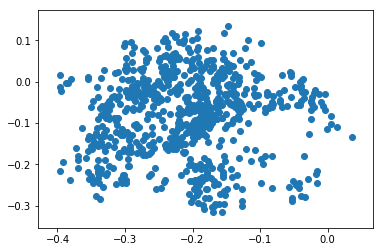

-3.646352644171567


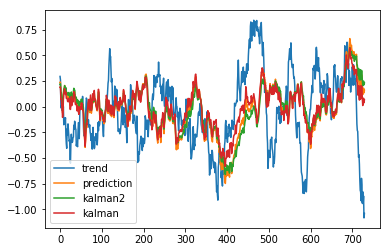

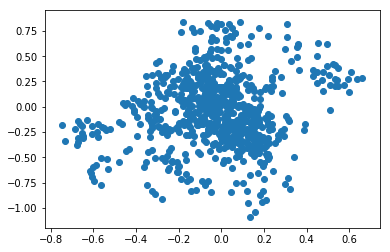

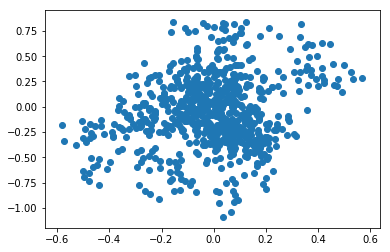

-3.6465789704583598


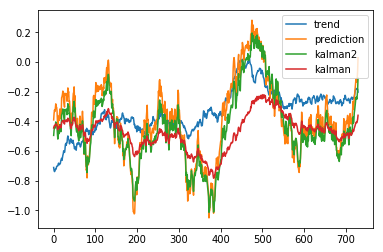

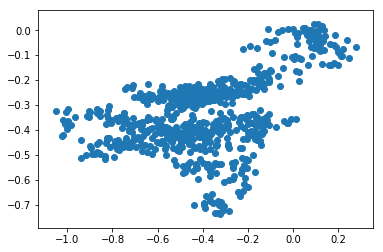

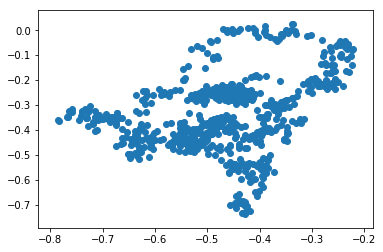

-3.6466959888115538


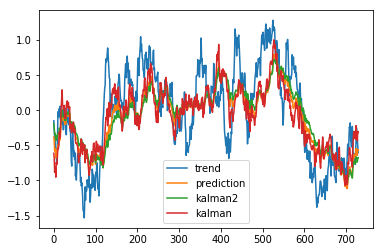

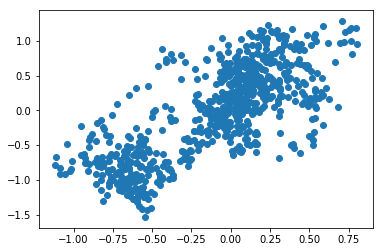

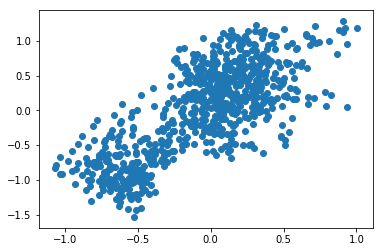

-3.646623537037523


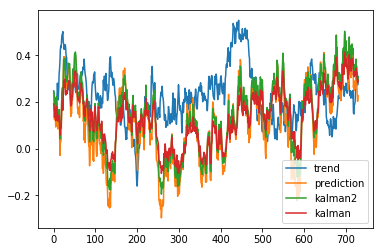

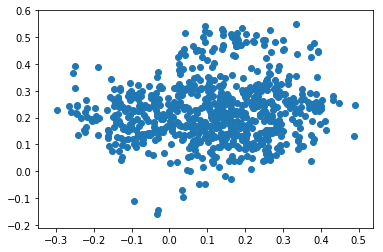

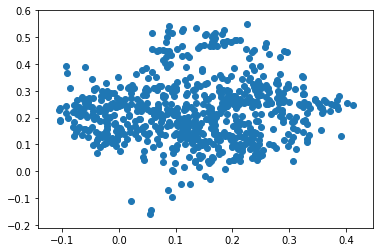

-3.6466175246518118


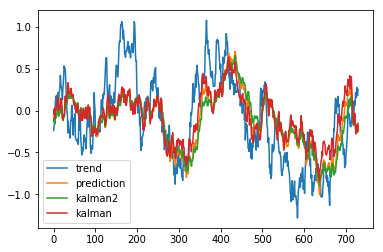

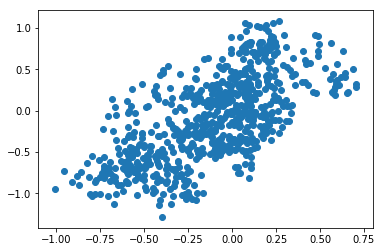

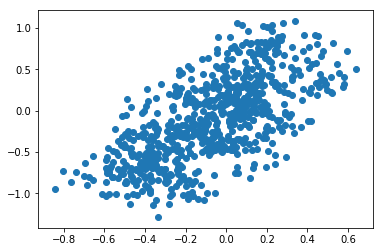

-3.6466176019515855


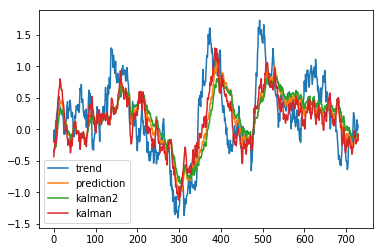

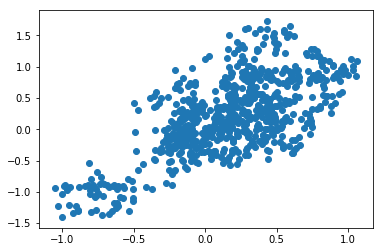

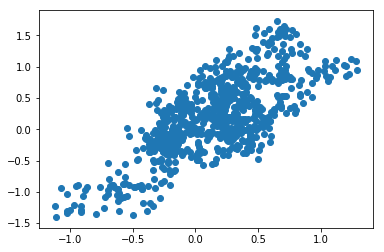

-3.646622949605809


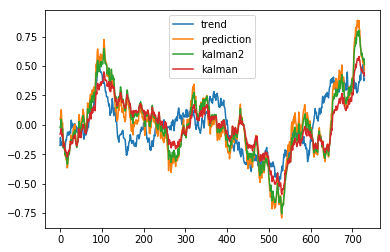

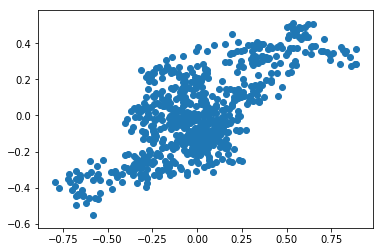

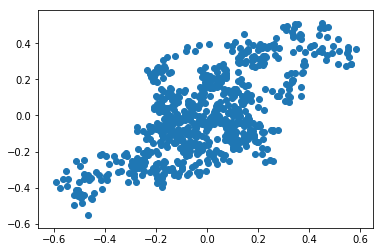

-3.6466392682399613


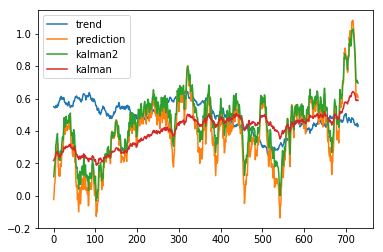

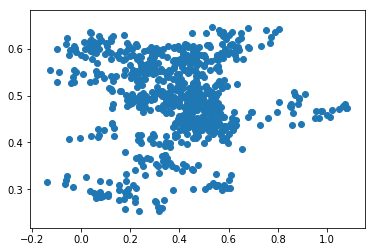

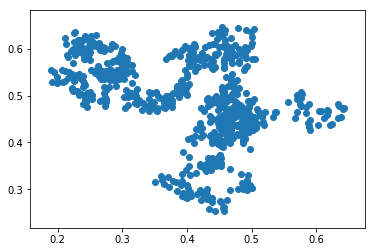

-3.6465113508515072


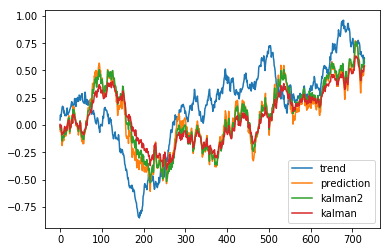

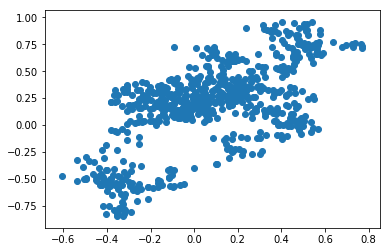

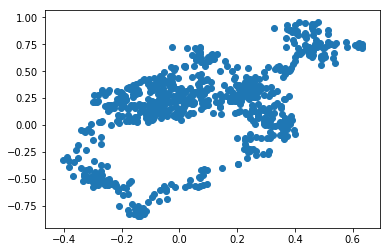

-3.646497326763348


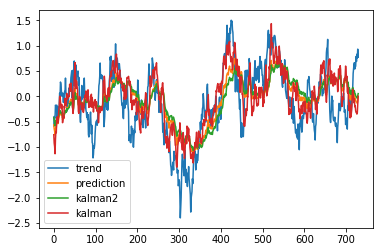

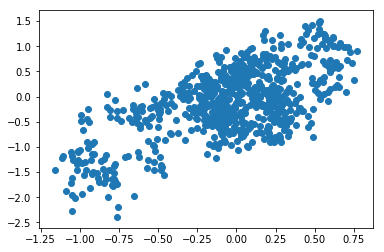

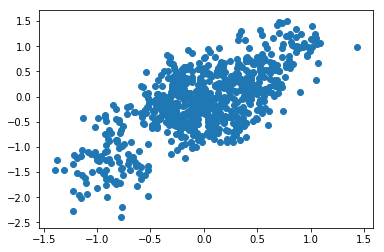

-3.6464317318517727


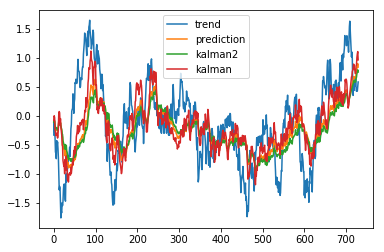

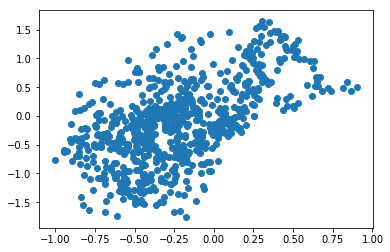

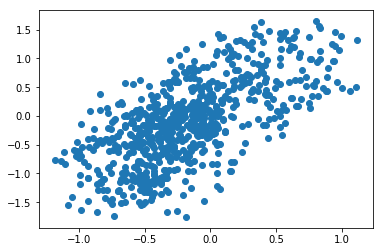

-3.6466472915839416


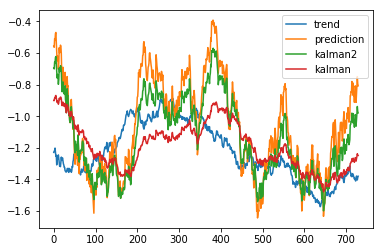

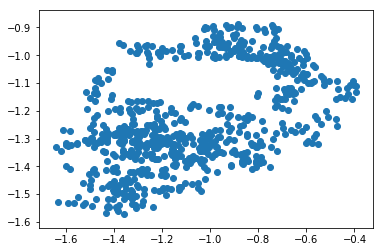

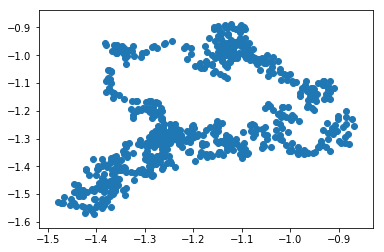

-3.646261554770173


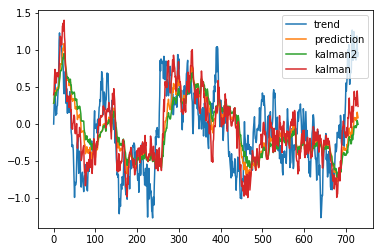

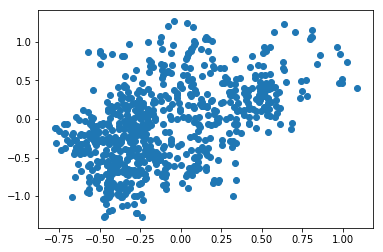

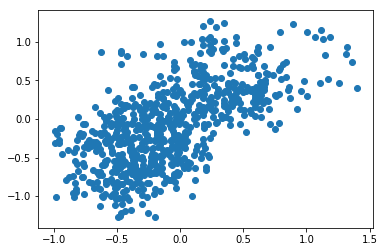

-3.6463111062534166


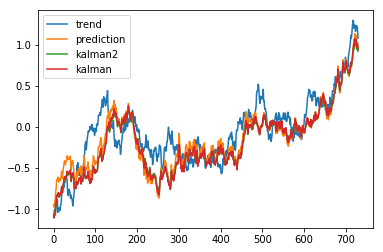

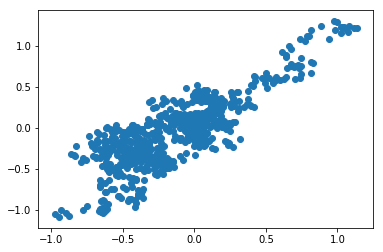

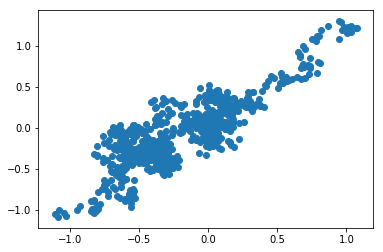

-3.646688529616223


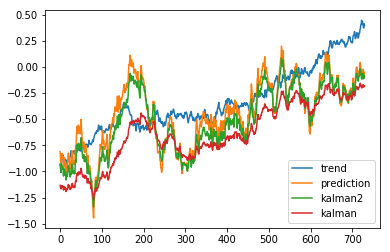

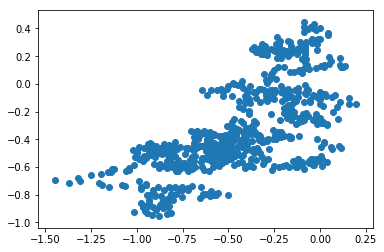

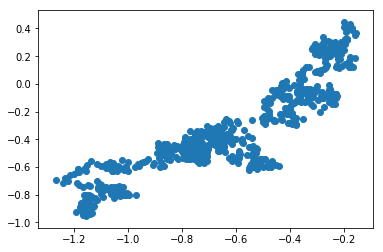

-3.6461551709566278


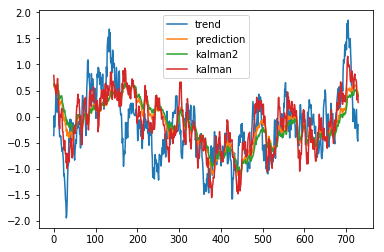

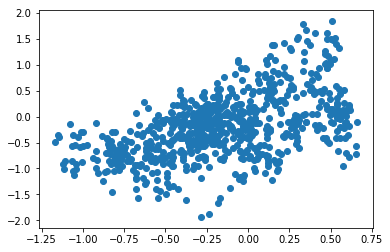

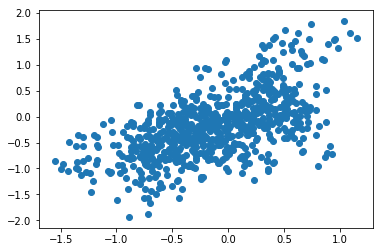

-3.646561914449559


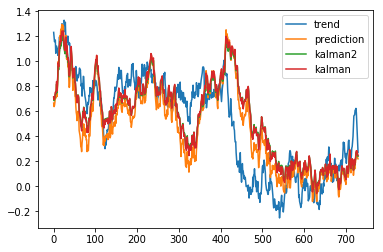

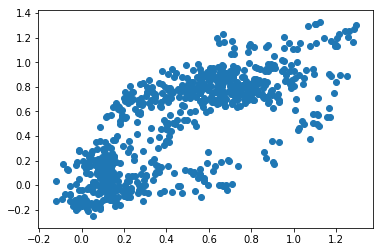

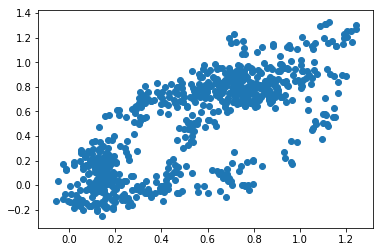

-3.6465055047068757


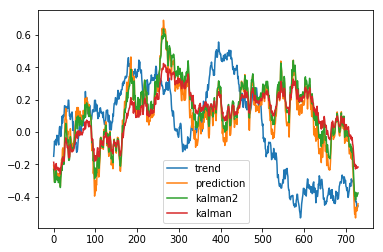

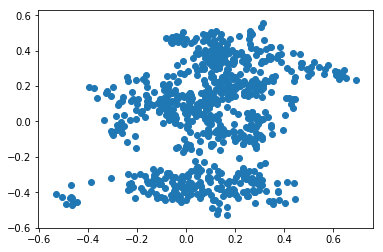

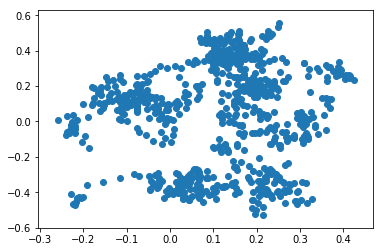

-3.6466319666709763


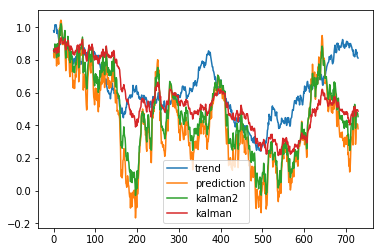

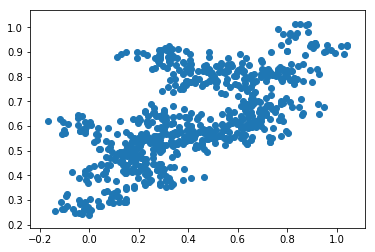

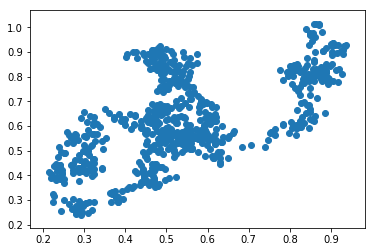

-3.6466579189058406


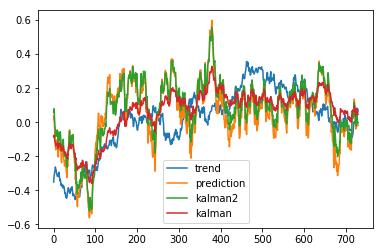

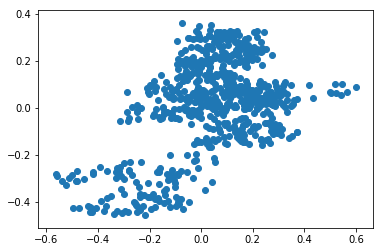

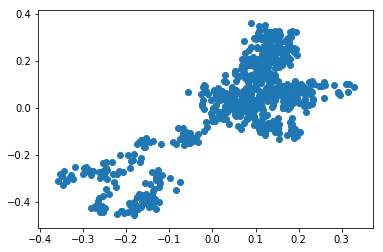

-3.6466579207684857


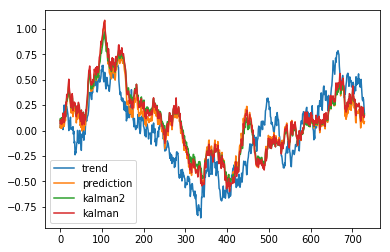

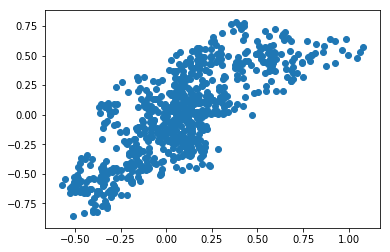

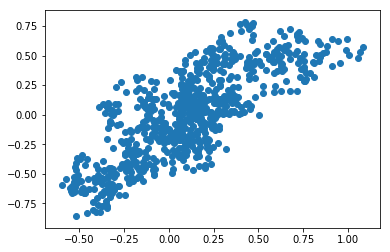

-3.6466103904880596


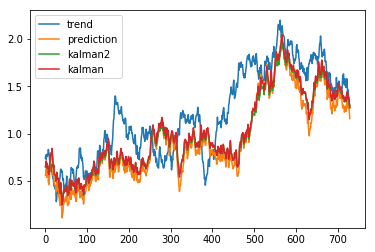

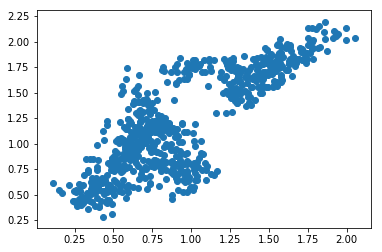

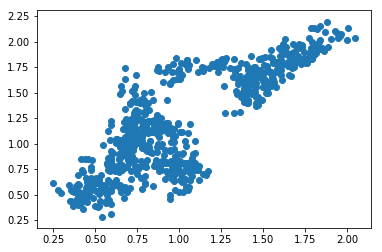

-3.6466218639165175


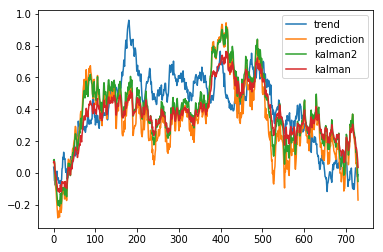

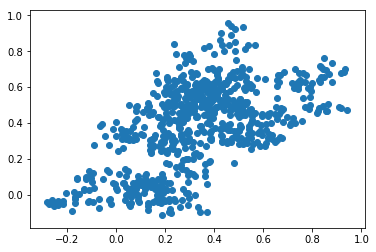

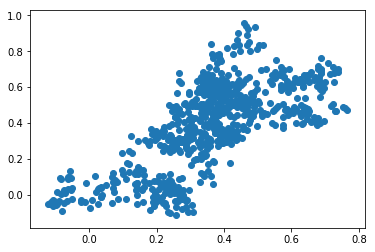

-3.6465680504683418


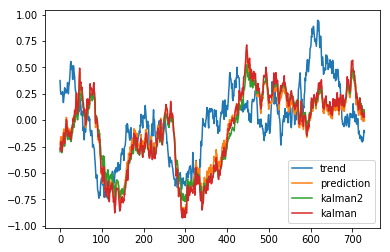

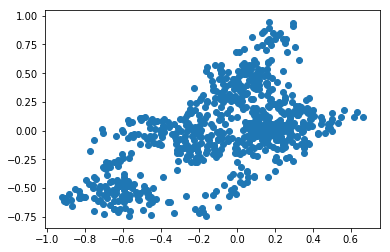

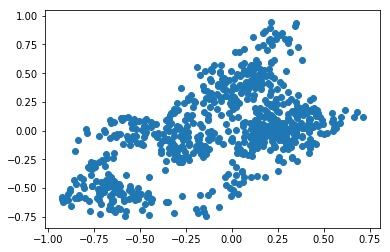

-3.6465039098169667


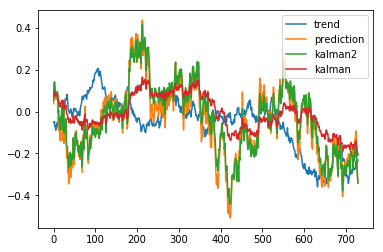

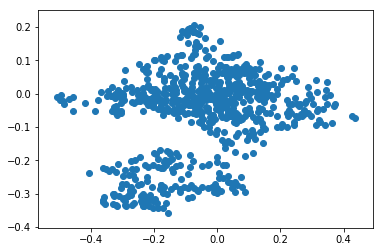

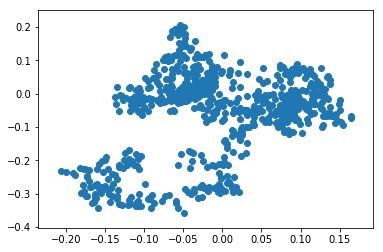

-3.646238332707436


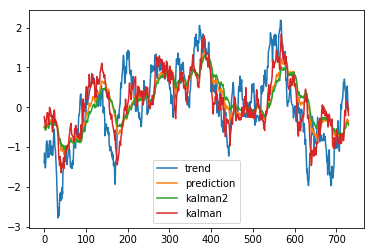

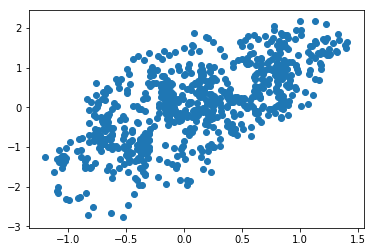

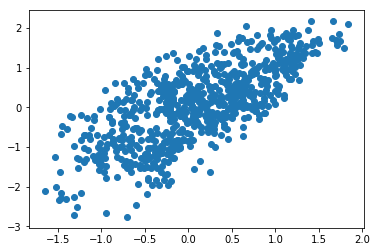

-3.646611956506969


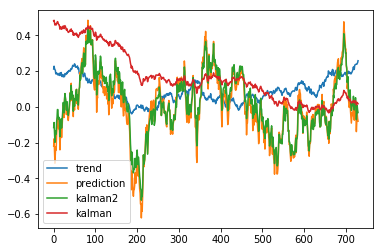

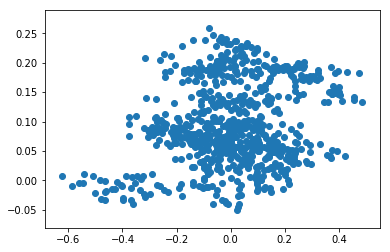

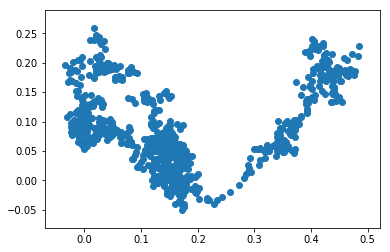

-3.6465586895123137


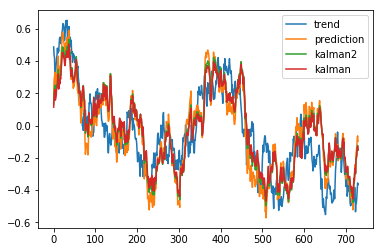

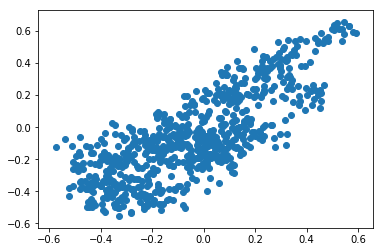

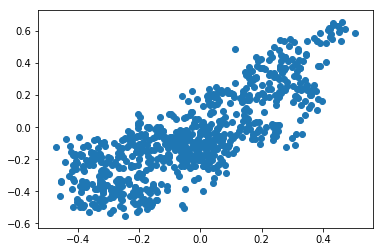

-3.6465445562265826


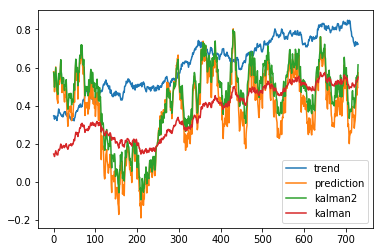

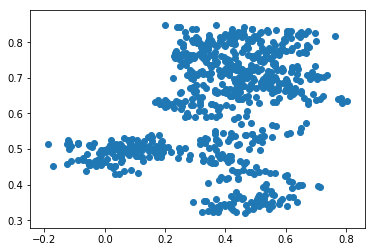

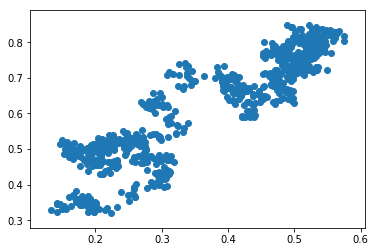

-3.6465993706136954


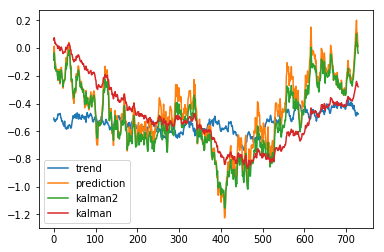

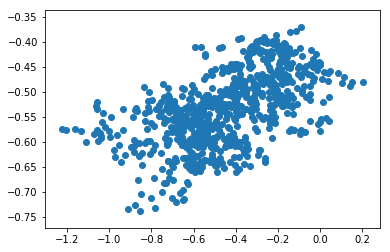

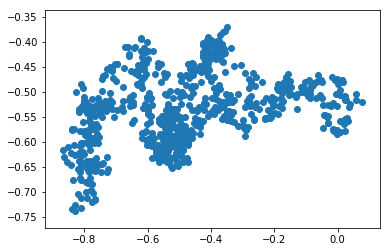

-3.6466881491709513


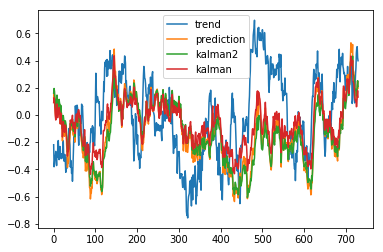

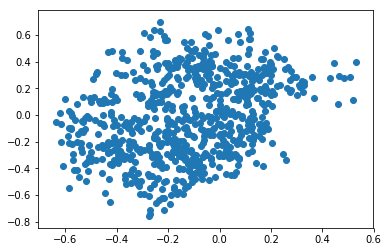

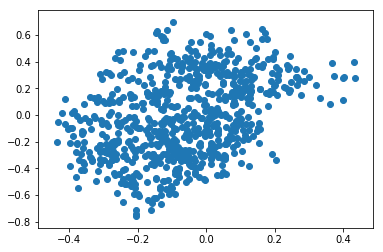

-3.646543130371721


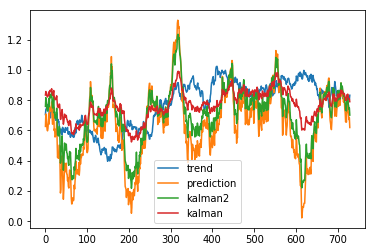

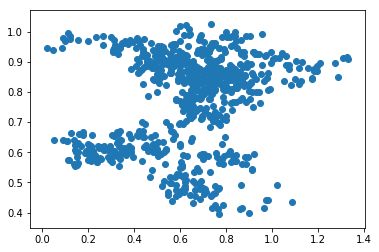

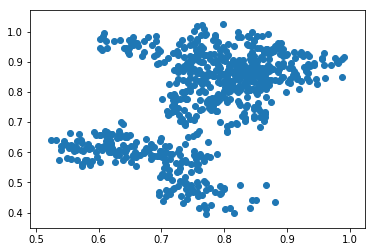

-3.646527505340056


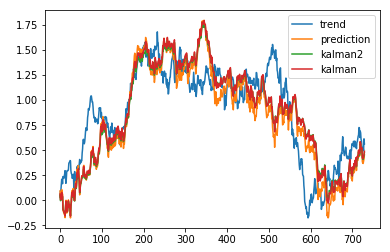

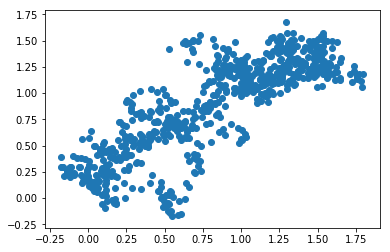

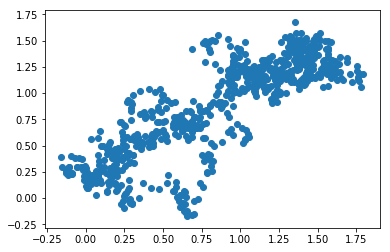

-3.6467066769022507


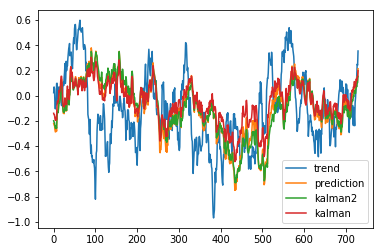

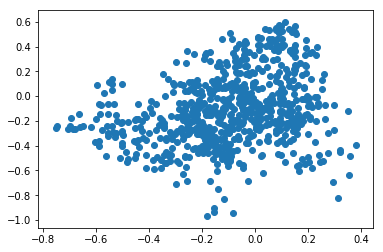

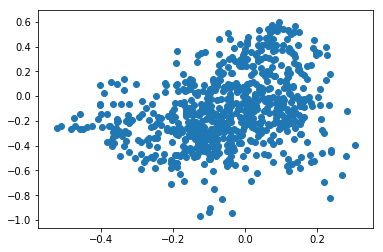

-3.646429487364368


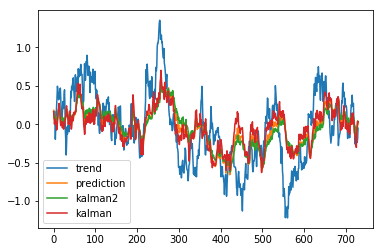

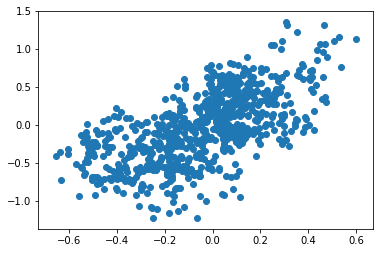

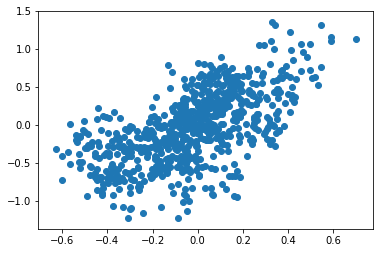

-3.646490830089898


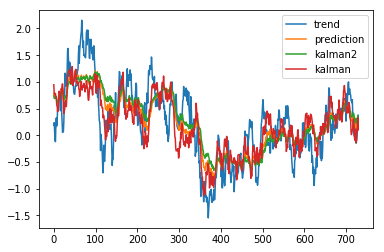

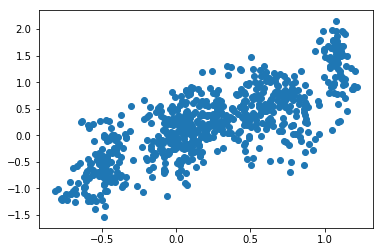

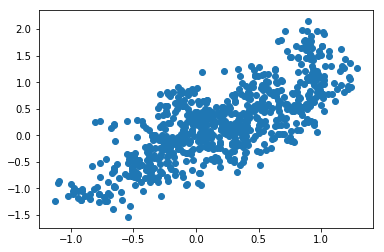

-3.64663559254259


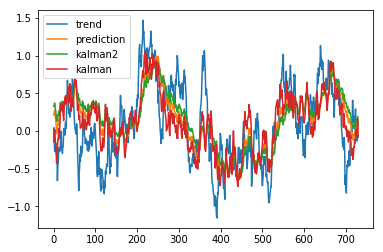

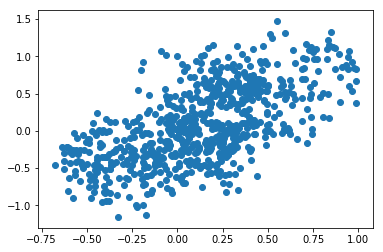

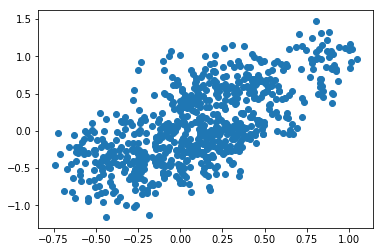

-3.6466712223831577


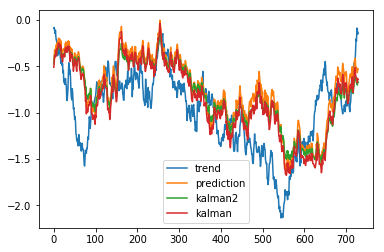

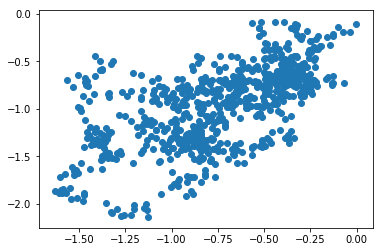

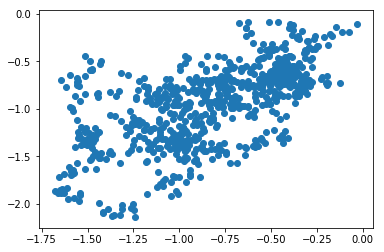

-3.6465953659266246


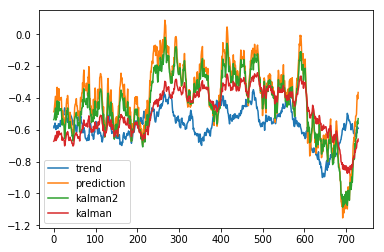

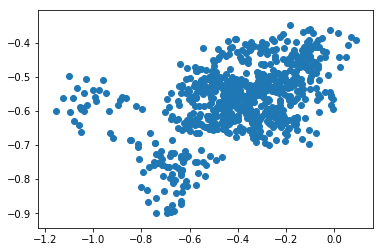

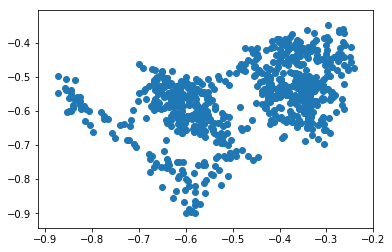

-3.6466645881067974


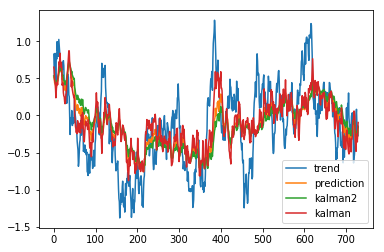

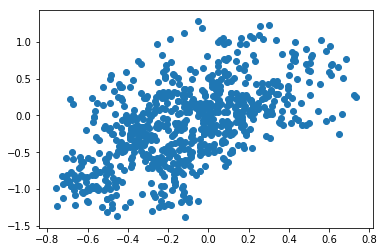

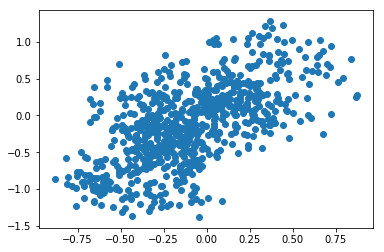

-3.6466630740091217


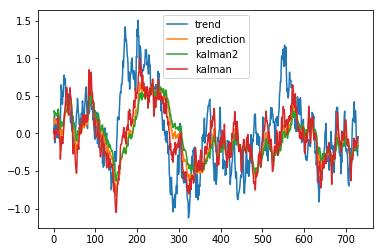

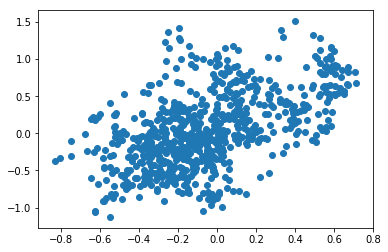

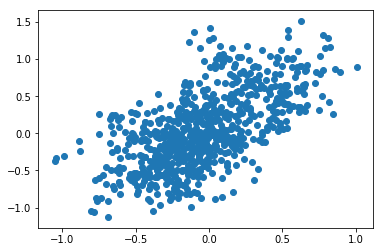

-3.646773089980708


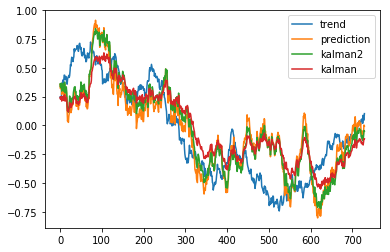

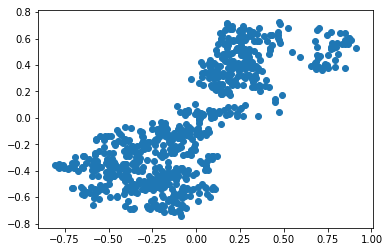

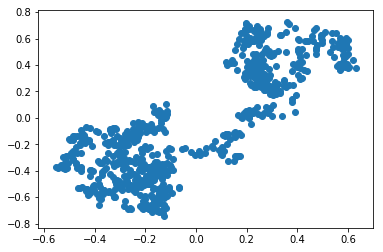

-3.6465095929801477


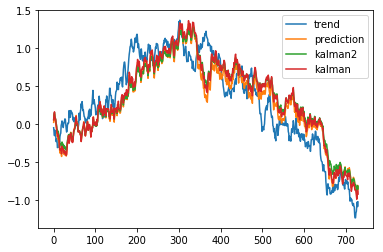

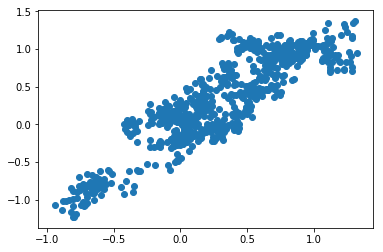

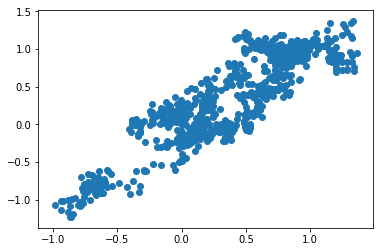

-3.6466379664838326


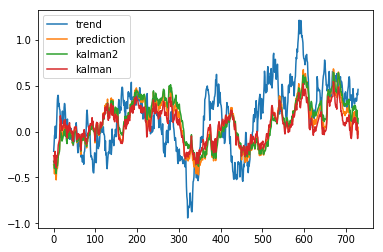

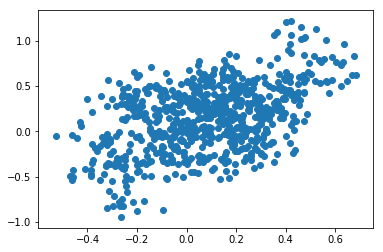

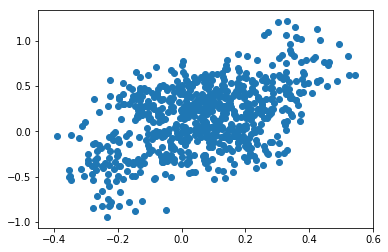

-3.6463652207516146


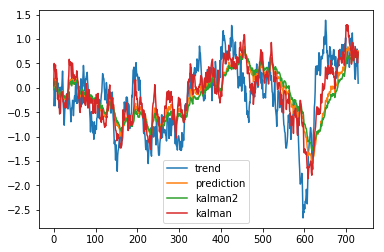

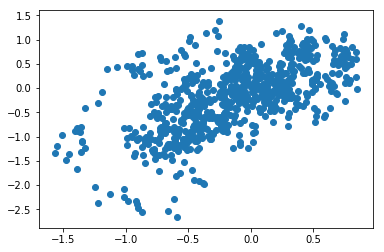

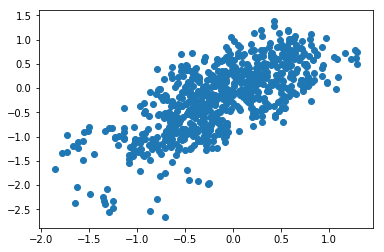

-3.646575156459586


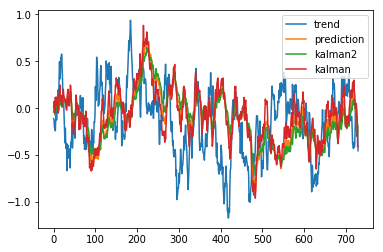

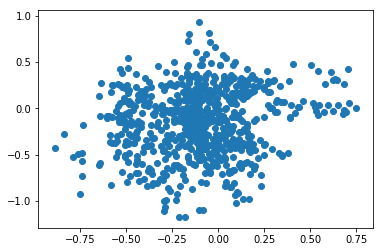

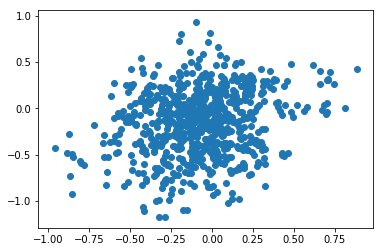

-3.6465712293051196


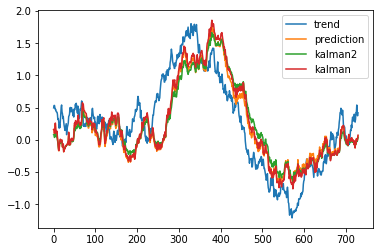

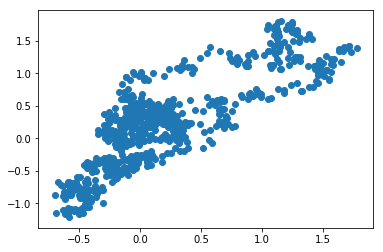

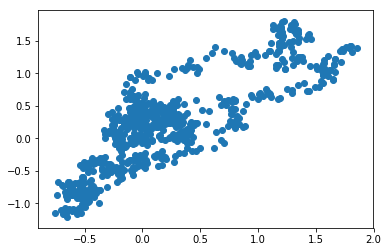

-3.646551579097287


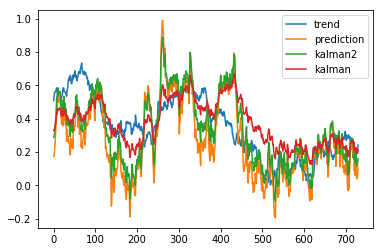

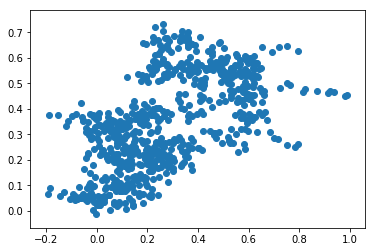

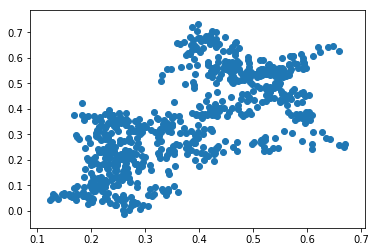

-3.6465684961061937


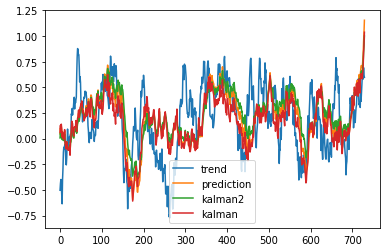

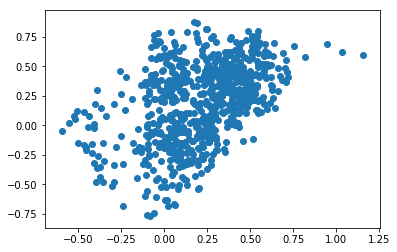

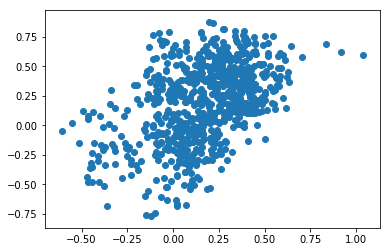

-3.646645327890293


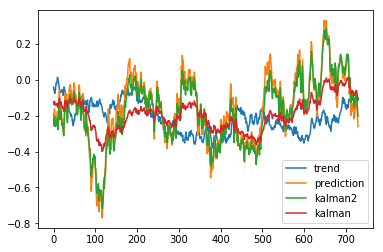

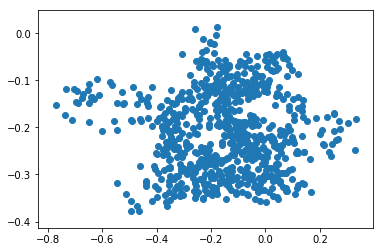

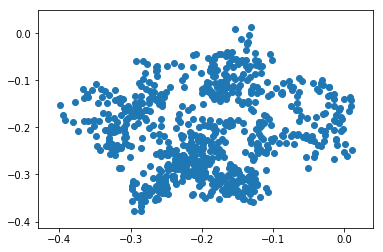

-3.6465904853306723


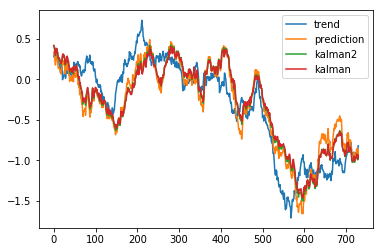

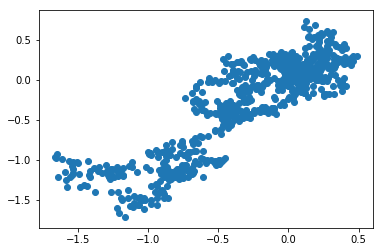

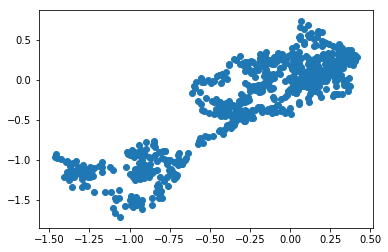

-3.6464358967263264


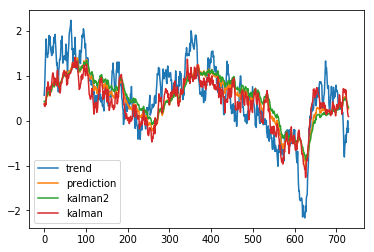

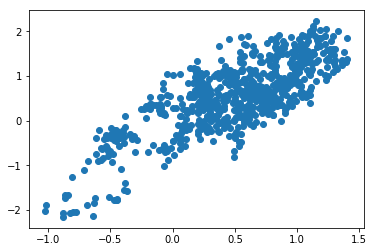

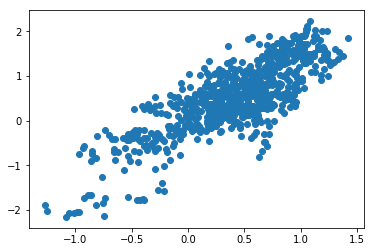

-3.646610375121237


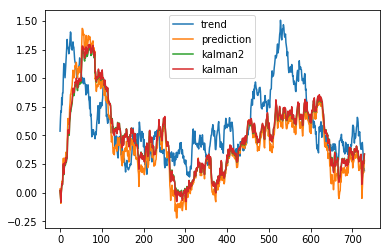

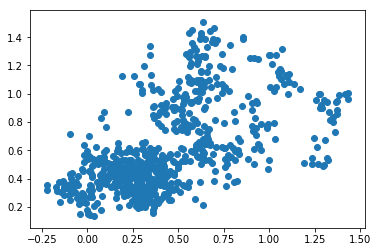

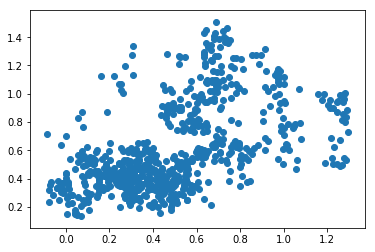

-3.646604253072293


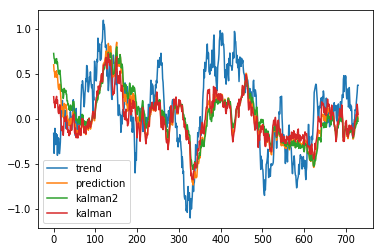

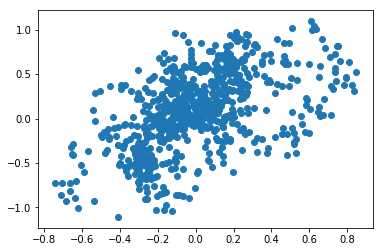

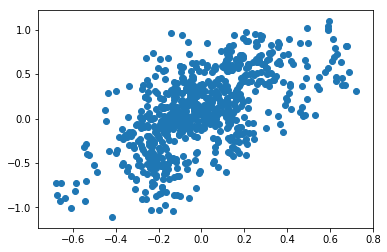

-3.646599367586897


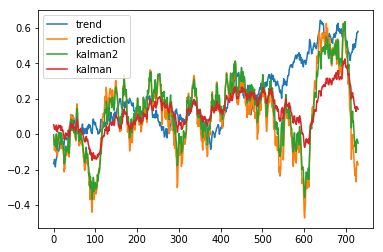

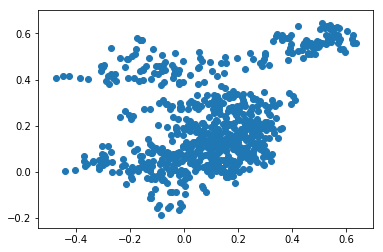

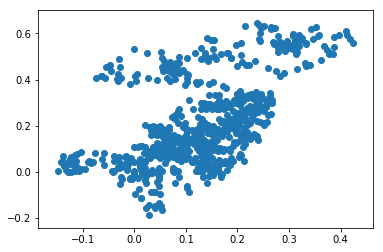

-3.6466085478663457


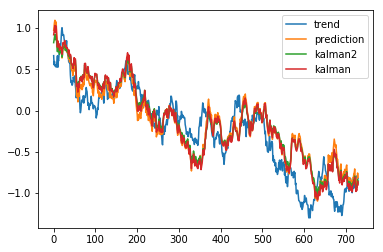

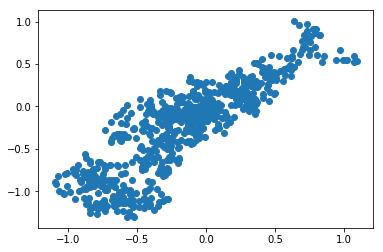

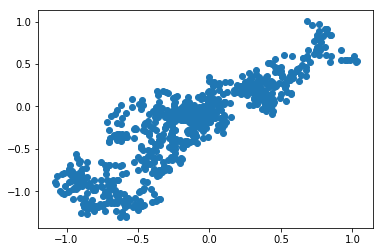

-3.64656684533693


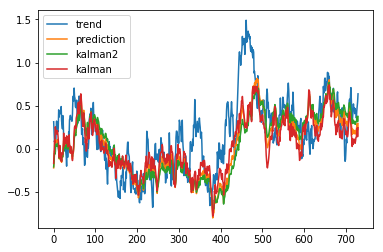

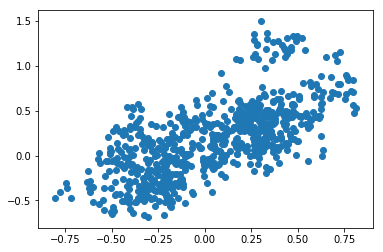

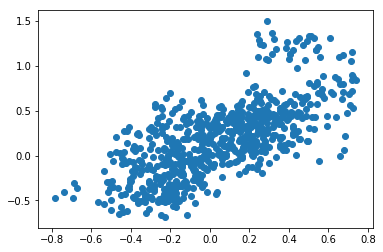

-3.6465348364785326


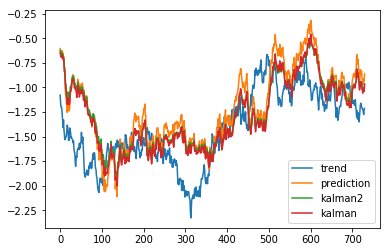

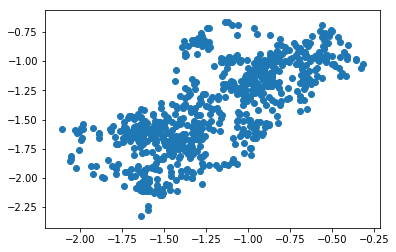

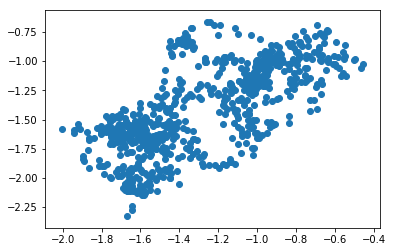

-3.6466031785588724


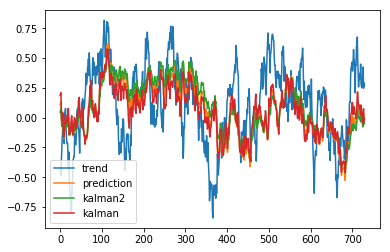

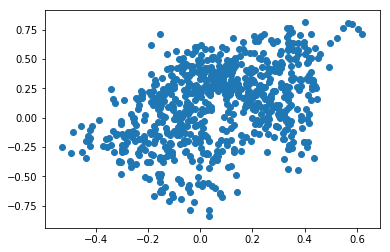

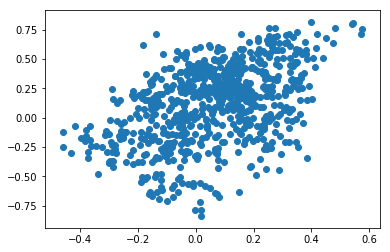

-3.646413534972818


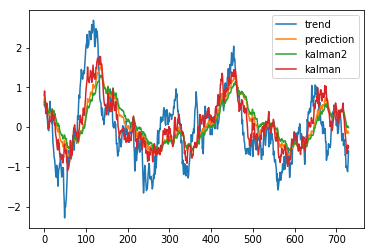

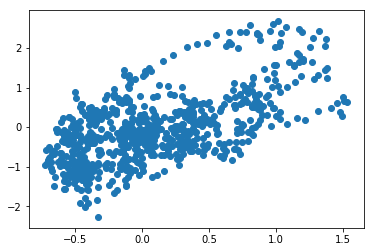

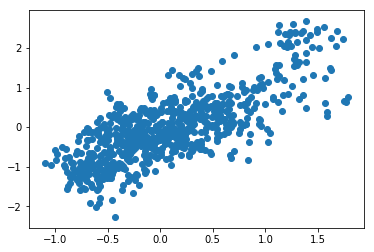

-3.646568578761072


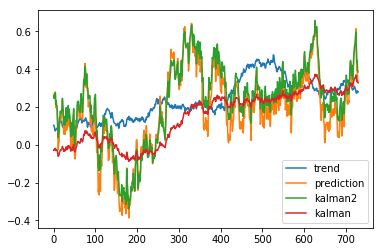

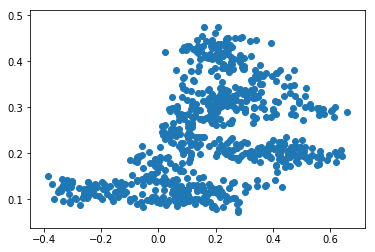

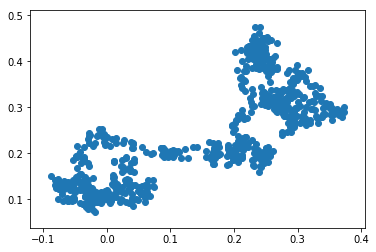

-3.64653915106319


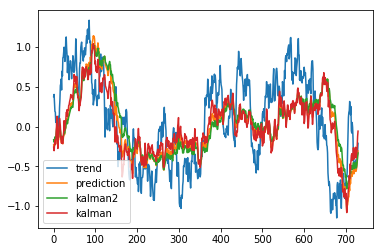

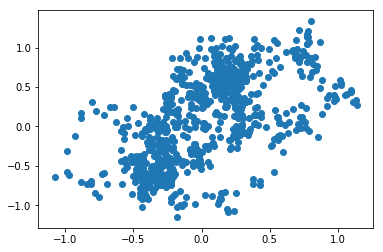

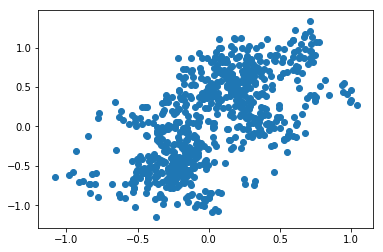

-3.6466831449419272


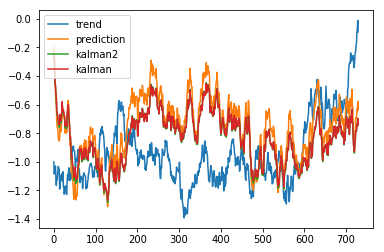

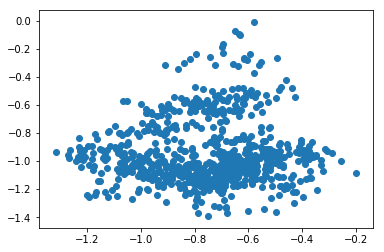

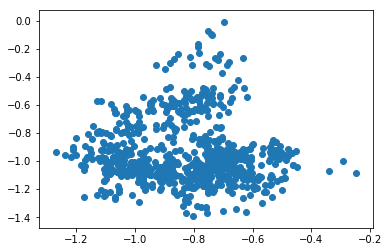

-3.646556861791761


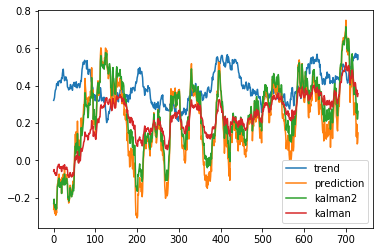

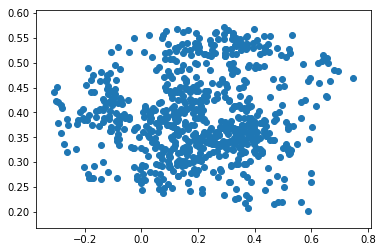

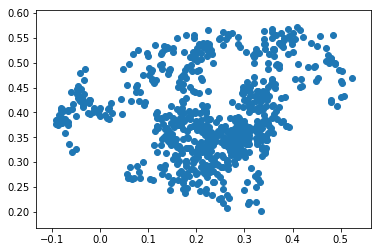

-3.6463462930172694


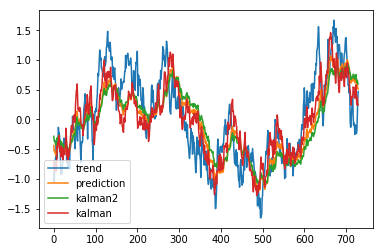

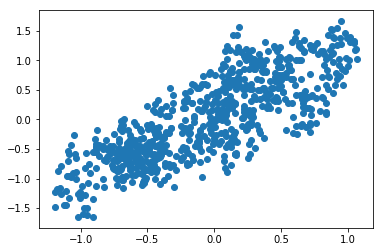

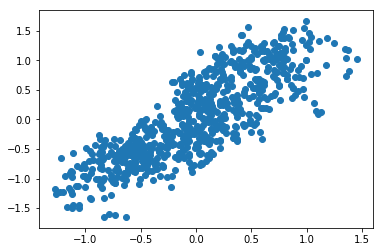

-3.6466227654367698


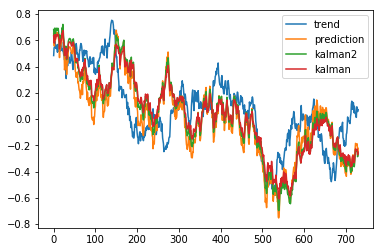

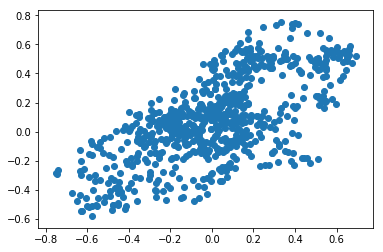

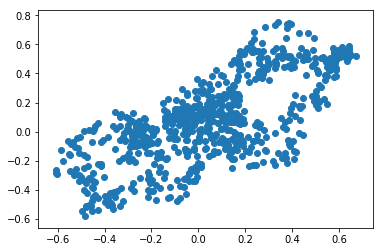

-3.64665752449073


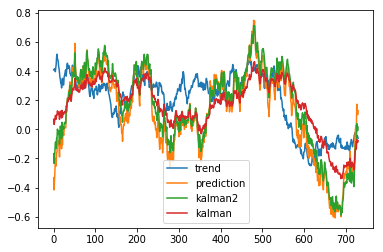

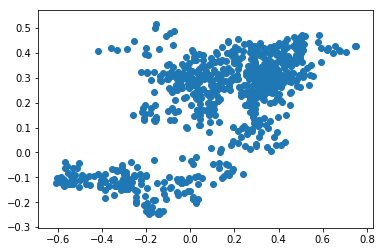

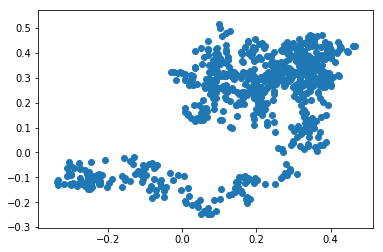

-3.6466080186422927


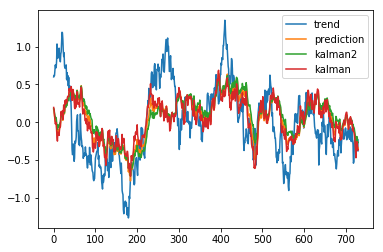

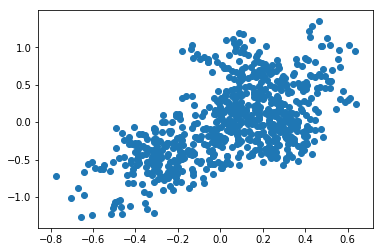

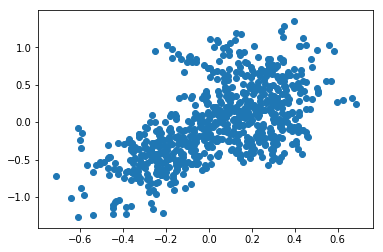

-3.646642641723157


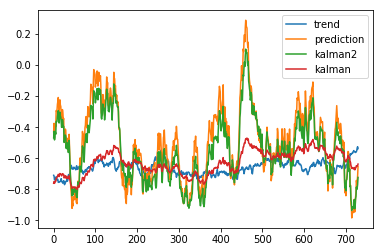

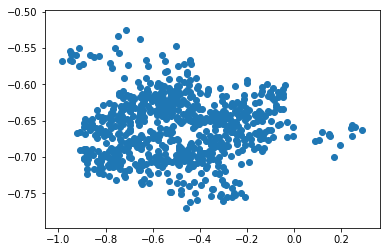

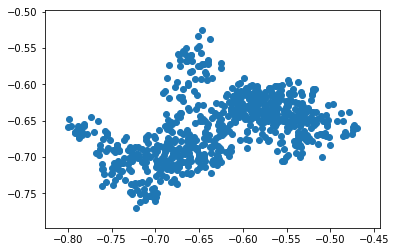

-3.6465785008389515


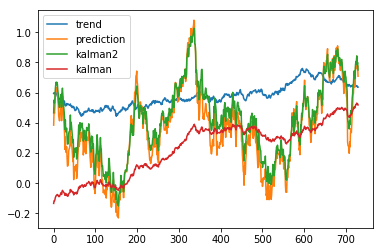

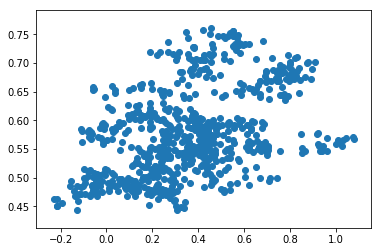

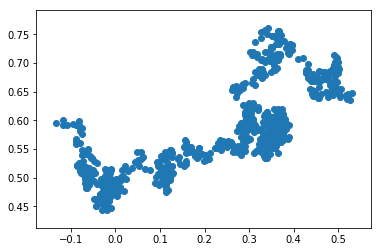

-3.6466381378471864


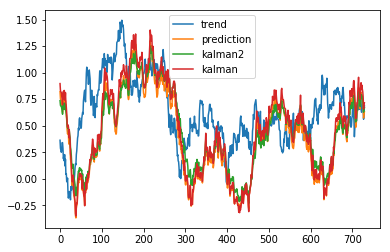

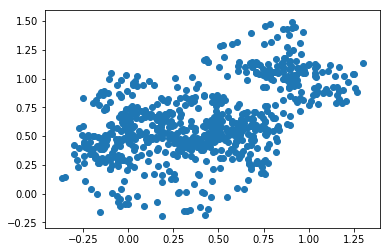

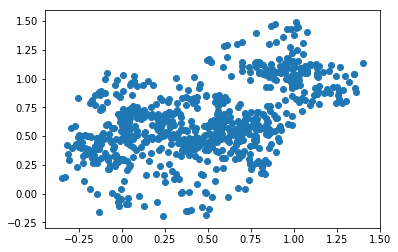

-3.646591478819029


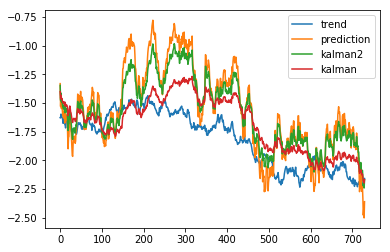

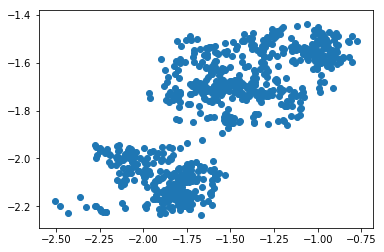

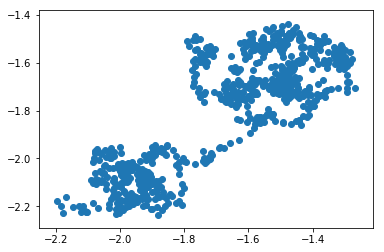

-3.6466563058551413


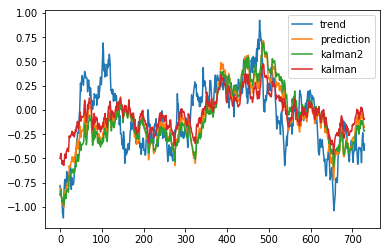

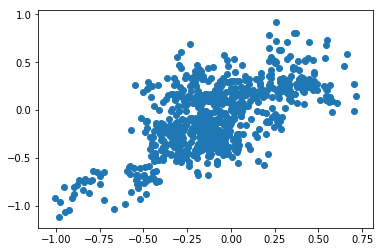

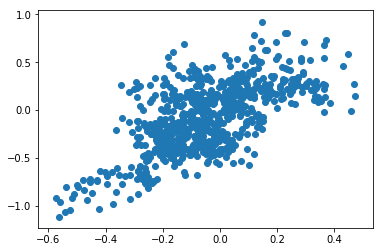

-3.646459763729946


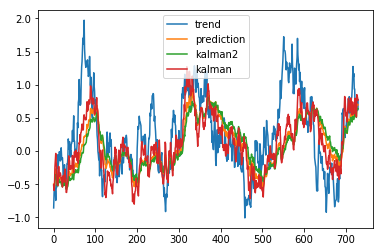

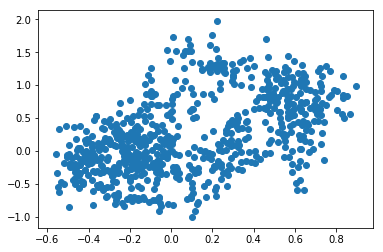

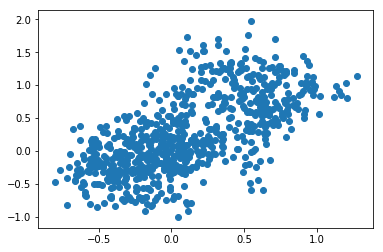

-3.6464761785231543


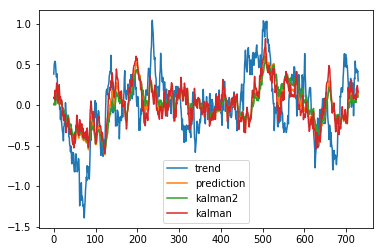

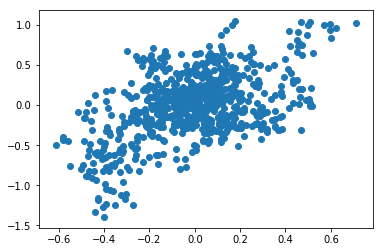

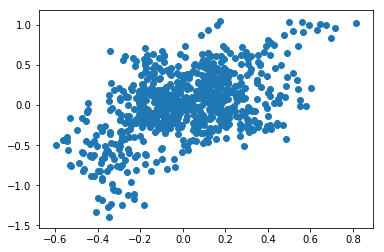

In [11]:
writer = tf.summary.FileWriter(logs_dir, graph)
lrate = 0.001
with tf.Session(graph=graph) as sess:
    sess.run(tf.global_variables_initializer())
    for i in range(3000):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        variables =tf.trainable_variables()
        if i==1500:
            lrate /= 3.
        
        if i==2250:
            lrate /= 3.
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: lrate,
               grad_clip: 0.1}
        if (i+1) %100 == 0 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        sess.run( [optimizer], feed_dict=feed)
        ## print result
    for i in range(100):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: 0.001,
               grad_clip: 0.1}
        if i> -1 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        

writer.close()   

In [12]:
len(kalman_result[start:])

730

In [13]:
dicti

{'T': 3,
 'deltaT': 0.0027397260273972603,
 'lbd': 10,
 'sigma': 2.2845275909999065}

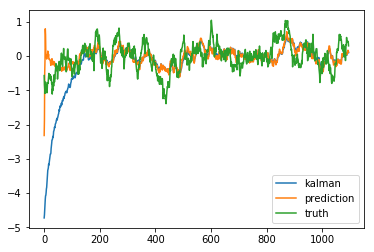

In [14]:
index=0
lbd = 1
sigma = 0.9
sigmaS= 0.1
deltaT= 1./365
kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                 sigmaS =sigmaS ,
                                 lbd=lbd,
                                 sigmamu= sigma,
                                 deltaT=deltaT )
plt.plot(kalman_result, label='kalman' )
#plt.plot(X[index,:,0])
plt.plot( result[1][index,:,0] , label = 'prediction')
plt.plot( trends[1:,0] , label= 'truth')
plt.legend( loc='best')
plt.show()

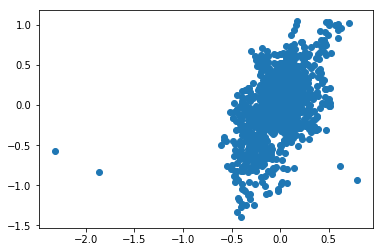

In [15]:
plt.scatter( result[1][0,:,0], trends[1:,0])
plt.show()

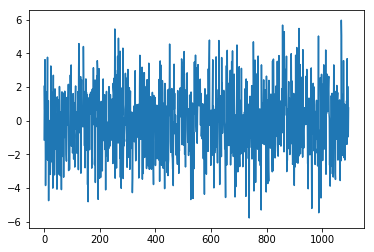

In [16]:
plt.plot(Y[0,:,0])
plt.show()